# **EDA и визуализация**

## **EDA**

### Импортируем библиотеки

In [1713]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import statistics as st
from tqdm.notebook import tqdm
import seaborn as sns
import random
import time

### Фиксируем датчик случайных чисел

In [1714]:
random.seed(42)
np.random.seed(42)

### Загружаем данные из файла

In [1715]:
df = pd.read_csv('data.csv')

### Смотрим информацию по полям датасета

In [1716]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100725 entries, 0 to 100724
Data columns (total 53 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Unnamed: 0    100725 non-null  int64  
 1   url_car       100725 non-null  object 
 2   car_make      100725 non-null  object 
 3   car_model     100725 non-null  object 
 4   car_gen       100725 non-null  object 
 5   car_type      100725 non-null  object 
 6   car_compl     100725 non-null  object 
 7   ann_date      100725 non-null  object 
 8   ann_id        100725 non-null  int64  
 9   car_price     100725 non-null  int64  
 10  ann_city      100725 non-null  object 
 11  link_cpl      100725 non-null  object 
 12  avail         100725 non-null  object 
 13  year          100725 non-null  int64  
 14  mileage       100725 non-null  int64  
 15  color         100725 non-null  object 
 16  eng_size      99139 non-null   float64
 17  eng_power     100725 non-null  int64  
 18  eng_

### Разделяем датасет на тренировочные и тестовые данные

In [1717]:
df_train, df_test = train_test_split(df, train_size=0.75, random_state=42)

In [1718]:
df_train_base = df_train.copy()
df_test_base = df_test.copy()

### **Обработаем данные**
Преобразования данных будем проводить на основе данных в тренировочном датасете

#### Посмотрим, что внутри

In [1719]:
pd.set_option('display.max_columns', None)

In [1720]:
df_train.sample(10)

,Unnamed: 0,url_car,car_make,car_model,car_gen,car_type,car_compl,ann_date,ann_id,car_price,ann_city,link_cpl,avail,year,mileage,color,eng_size,eng_power,eng_power_kw,eng_type,pow_resrv,options,transmission,drive,st_wheel,condition,count_owner,original_pts,customs,url_compl,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
98141,98141,https://auto.ru/cars/used/sale/volvo/s60/11203...,Volvo,S60,I,Седан,2.4 MT (170 л.с.),2024-09-06,1120382000,570000,Москва,https://auto.ru/catalog/cars/volvo/s60/4841961...,В наличии,2004,214000,синий,2.4,170,NaN,Бензин,NaN,1 опция,механическая,передний,Левый,Не требует ремонта,3 или более,Оригинал,Растаможен,https://auto.ru/catalog/cars/volvo/s60/4841961...,Швеция,D,4,5,4576,1804,1428,130.0,424.0,70.0,1500.0,1980.0,дисковые,дисковые,225.0,8.7,6.9,АИ-95,переднее,поперечное,нет,230.0,5.0
94391,94391,https://auto.ru/cars/used/sale/volkswagen/jett...,Volkswagen,Jetta,VII Рестайлинг,Седан,GLI 2.0 AMT (228 л.с.),2024-11-21,1124291945,3470000,Ставрополь,https://auto.ru/catalog/cars/volkswagen/jetta/...,В наличии,2022,8450,белый,2.0,228,NaN,Бензин,NaN,GLI,роботизированная,передний,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,https://auto.ru/catalog/cars/volkswagen/jetta/...,Германия,C,4,5,4738,1799,1465,127.0,510.0,50.0,1522.0,1990.0,дисковые,дисковые,NaN,NaN,6.5,АИ-95,переднее,поперечное,турбонаддув,350.0,4.0
55659,55659,https://auto.ru/cars/used/sale/mitsubishi/paje...,Mitsubishi,Pajero Sport,II,Внедорожник 5 дв.,2.5d AT (178 л.с.) 4WD,2024-08-21,1124658499,1350000,Тверь,https://auto.ru/catalog/cars/mitsubishi/pajero...,В наличии,2011,215000,серебристый,2.5,178,NaN,Дизель,NaN,1 опция,автоматическая,полный,Левый,Не требует ремонта,3 или более,Оригинал,Растаможен,https://auto.ru/catalog/cars/mitsubishi/pajero...,Япония,J,5,5,4695,1815,1800,215.0,NaN,70.0,2050.0,2710.0,дисковые,дисковые,176.0,12.4,8.3,ДТ,переднее,продольное,турбонаддув,350.0,4.0
46475,46475,https://auto.ru/cars/used/sale/lixiang/l6/1125...,LiXiang,L6,2024-н.в.,Внедорожник 5 дв.,1.5hyb AT (408 л.с.) 4WD,2024-10-15,1125466304,6490000,Самара,https://auto.ru/catalog/cars/lixiang/l6/239455...,В наличии,2024,32,чёрный,1.5,408,NaN,Гибрид,NaN,Max,автоматическая,полный,Левый,Не требует ремонта,1 владелец,Оригинал,Растаможен,https://auto.ru/catalog/cars/lixiang/l6/239455...,Китай,E,5,5,4925,1960,1735,180.0,491.0,60.0,2330.0,2820.0,дисковые,дисковые,180.0,5.4,NaN,АИ-95,переднее,поперечное,турбонаддув,529.0,4.0
6605,6605,https://auto.ru/cars/used/sale/buick/gl8/11246...,Buick,GL8,III,Минивэн,2.0 AT (260 л.с.),2024-08-22,1124671556,3300000,Владивосток,https://auto.ru/catalog/cars/buick/gl8/2122133...,На заказ,2020,73000,коричневый,2.0,260,NaN,Бензин,NaN,1 опция,автоматическая,передний,Левый,Не требует ремонта,2 владельца,Оригинал,Растаможен,https://auto.ru/catalog/cars/buick/gl8/2122133...,США,M,5,7,5203,1878,1805,NaN,521.0,70.0,1980.0,NaN,дисковые,дисковые,205.0,9.3,6.7,АИ-95,переднее,поперечное,турбонаддув,350.0,4.0
15695,15695,https://auto.ru/cars/used/sale/citroen/c4/1125...,Citroen,C4,II Рестайлинг,Седан,1.6 AT (150 л.с.),2024-11-07,1125464269,1137000,Воронеж,https://auto.ru/catalog/cars/citroen/c4/204880...,В наличии,2017,127560,коричневый,1.6,150,NaN,Бензин,NaN,SHINE Ultimate,автоматическая,передний,Левый,Не требует ремонта,3 или более,Оригинал,Растаможен,https://auto.ru/catalog/cars/citroen/c4/204880...,Франция,C,4,5,4621,1789,1496,176.0,440.0,60.0,1374.0,1810.0,дисковые,дисковые,207.0,8.1,5.1,АИ-95,переднее,поперечное,турбонаддув,240.0,4.0
69602,69602,https://auto.ru/cars/used/sale/ram/1500/112545...,Ram,1500,V,Пикап Двойная кабина Crew Cab TRX,Crew Cab TRX 6.2 AT (712 л.с.) 4WD,2024-11-18,1125454390,15990000,Москва,https://auto.ru/catalog/cars/ram/1500/22501433...,В наличии,2023,4900,чёрный,6.2,712,NaN,Бензин,NaN,TRX,автоматическая,полный,Левый,Не тре

In [1721]:
df_train.describe(include='all')

,Unnamed: 0,url_car,car_make,car_model,car_gen,car_type,car_compl,ann_date,ann_id,car_price,ann_city,link_cpl,avail,year,mileage,color,eng_size,eng_power,eng_power_kw,eng_type,pow_resrv,options,transmission,drive,st_wheel,condition,count_owner,original_pts,customs,url_compl,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
count,75543.000000,75543,75543,75543,75543,75543,75543,75543,7.554300e+04,7.554300e+04,75543,75543,75543,75543.000000,75543.000000,75543,74361.000000,75543.000000,1182.000000,75543,1182.000000,75539,75543,75543,75543,75543,75543,75227,75543,75543,75543,75267,75543.000000,75543.000000,75543.000000,75543.000000,75543.000000,73490.000000,70007.000000,73406.000000,73439.000000,65764.000000,75543,74504,71790.000000,70091.000000,65248.000000,74017,74277,73592,74310,75151.000000,74361.000000
unique,NaN,75543,202,1785,1121,248,5332,366,NaN,NaN,2929,15670,3,NaN,NaN,16,NaN,NaN,NaN,9,NaN,2755,4,3,2,1,3,2,2,15670,24,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,3,NaN,NaN,NaN,7,3,2,3,NaN,NaN
top,NaN,https://auto.ru/cars/used/sale/suzuki/sx4/1124...,Porsche,Cayenne,I,Внедорожник 5 дв.,1.5 CVT (147 л.с.),2024-11-07,NaN,NaN,Москва,https://auto.ru/catalog/cars/daewoo/matiz/2309...,В наличии,NaN,NaN,чёрный,NaN,NaN,NaN,Бензин,NaN,1 опция,автоматическая,передний,Левый,Не требует ремонта,3 или более,Оригинал,Растаможен,https://auto.ru/catalog/cars/daewoo/matiz/2309...,Япония,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,дисковые,дисковые,NaN,NaN,NaN,АИ-95,переднее,поперечное,нет,NaN,NaN
freq,NaN,1,2371,1397,16726,34235,952,2240,NaN,NaN,14011,611,71391,NaN,NaN,18173,NaN,NaN,NaN,61953,NaN,21052,36363,38617,72695,75543,29916,63242,75542,611,16458,21030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74185,56527,NaN,NaN,NaN,44200,73592,50383,43502,NaN,NaN
mean,50384.731252,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.124176e+09,2.631754e+06,NaN,NaN,NaN,2013.226533,137095.041314,NaN,2.143657,182.344665,351.749577,NaN,542.669205,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.616655,5.021829,4562.035940,1822.905842,1608.248481,176.580201,512.066179,61.427186,1582.632389,2107.882489,NaN,NaN,192.649979,10.735036,6.807507,NaN,NaN,NaN,NaN,282.420713,4.457928
std,29144.932172,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.816934e+06,6.179655e+06,NaN,NaN,NaN,8.665609,96622.619508,NaN,0.926650,115.722576,166.836430,NaN,139.671508,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.655044,0.636568,379.971046,110.903524,155.909483,31.141376,318.610804,14.193275,419.446356,500.910414,NaN,NaN,31.849559,4.023259,1.902249,NaN,NaN,NaN,NaN,265.534452,1.215468
min,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.618293e+07,1.050000e+04,NaN,NaN,NaN,1923.000000,1.000000,NaN,0.200000,10.000000,30.000000,NaN,135.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,2.000000,2499.000000,1000.000000,1000.000000,76.000000,50.000000,16.000000,399.000000,810.000000,NaN,NaN,60.000000,2.020000,1.400000,NaN,NaN,NaN,NaN,19.000000,1.000000
25%,25091.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.124158e+09,6.956025e+05,NaN,NaN,NaN,2010.000000,59950.000000,NaN,1.600000,112.000000,225.000000,NaN,450.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,5.000000,4350.000000,1765.000000,1473.000000,152.000000,387.000000,51.000000,1288.000000,1755.000000,NaN,NaN,175.000000,8.200000,5.600000,NaN,NaN,NaN,NaN,156.000000,4.000000
50%,50387.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125276e+09,1.375000e+06,NaN,NaN,NaN,2014.000000,130355.000000,NaN,2.000000,150.000000,386.000000,NaN,539.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,5.000000,4595.000000,1822.000000,1615.000000,175.000000,477.000000,60.000000,1505.000000,1990.000000,NaN,NaN,189.000000,10.600000,6.300000,NaN,NaN,NaN,NaN,223.000000,4.000000
75%,75694.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.125742e+09,2.600000e+06,NaN,NaN,NaN,2019.000000,198000.000000,NaN,2.500000,211.000000,442.000000,NaN

In [1722]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25182 entries, 73871 to 9894
Data columns (total 53 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    25182 non-null  int64  
 1   url_car       25182 non-null  object 
 2   car_make      25182 non-null  object 
 3   car_model     25182 non-null  object 
 4   car_gen       25182 non-null  object 
 5   car_type      25182 non-null  object 
 6   car_compl     25182 non-null  object 
 7   ann_date      25182 non-null  object 
 8   ann_id        25182 non-null  int64  
 9   car_price     25182 non-null  int64  
 10  ann_city      25182 non-null  object 
 11  link_cpl      25182 non-null  object 
 12  avail         25182 non-null  object 
 13  year          25182 non-null  int64  
 14  mileage       25182 non-null  int64  
 15  color         25182 non-null  object 
 16  eng_size      24778 non-null  float64
 17  eng_power     25182 non-null  int64  
 18  eng_power_kw  404 non-null  

#### Удаляем поля, использование которых не предполагается в модели

In [1723]:
def drop_columns(df):
    return df.drop(['Unnamed: 0', 'url_car', 'ann_id', 'ann_date', 'ann_city', 
                    'avail', 'original_pts', 'customs', 'link_cpl', 'eng_power_kw', 
                    'pow_resrv', 'options', 'condition', 'url_compl'], axis=1)

In [1724]:
df_train = drop_columns(df_train)
df_test = drop_columns(df_test)

In [1725]:
df_train_base = drop_columns(df_train_base)
df_test_base = drop_columns(df_test_base)

In [1726]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 75543 entries, 83453 to 15795
Data columns (total 39 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   car_make      75543 non-null  object 
 1   car_model     75543 non-null  object 
 2   car_gen       75543 non-null  object 
 3   car_type      75543 non-null  object 
 4   car_compl     75543 non-null  object 
 5   car_price     75543 non-null  int64  
 6   year          75543 non-null  int64  
 7   mileage       75543 non-null  int64  
 8   color         75543 non-null  object 
 9   eng_size      74361 non-null  float64
 10  eng_power     75543 non-null  int64  
 11  eng_type      75543 non-null  object 
 12  transmission  75543 non-null  object 
 13  drive         75543 non-null  object 
 14  st_wheel      75543 non-null  object 
 15  count_owner   75543 non-null  object 
 16  state_mark    75543 non-null  object 
 17  class_auto    75267 non-null  object 
 18  door_count    75543 non-nul

#### Обработаем поле 'car_type'  
Сгруппируем типы кузовов автомобилей

In [1727]:
def mod_car_type(x):
    car_type_short = [
        'Внедорожник 3 дв.',
        'Внедорожник 5 дв.',
        'Внедорожник открытый',
        'Кабриолет',
        'Компактвэн',
        'Купе',
        'Лифтбек',
        'Микровэн',
        'Минивэн',
        'Пикап Двойная кабина',
        'Пикап Одинарная кабина',
        'Пикап Полуторная кабина',
        'Родстер',
        'Седан',
        'Спидстер',
        'Тарга',
        'Универсал 5 дв.',
        'Фастбек',
        'Фургон',
        'Хэтчбек 3 дв.',
        'Хэтчбек 4 дв.',
        'Хэтчбек 5 дв.'
    ]
    for car_type in car_type_short:
        if car_type in x:
            x = car_type
    return x

In [1728]:
df_train['car_type'] = df_train['car_type'].apply(lambda x: mod_car_type(x) if not pd.isnull(x) else np.nan)
df_test['car_type'] = df_test['car_type'].apply(lambda x: mod_car_type(x) if not pd.isnull(x) else np.nan)

#### Создадим датасеты с медианами и модами и функции по их применению для различных группировок автомобилей по признакам

In [1729]:
def df_median_mode(df,columns):
    '''
    Функция получает на вход датасет и формирует по нему датасет
    с медианами и модами расчитанными в группировке
    по полям в списке columns
    '''
    columns_isnumber = df.select_dtypes([int, float]).columns.to_list()
    df_med_mod = df.copy()

    for column in columns_isnumber:
        df_med_mod[column] = df.groupby(columns)[column].transform('median')

    columns_isobject = df.select_dtypes([object]).columns.to_list()

    for column in columns:
        columns_isobject.remove(column)

    for column in columns_isobject:
        df_med_mod[column] = df.groupby(columns)[column].transform(lambda x: x.mode()[0] if len(x.mode()) > 0 else np.nan)

    df_med_mod = df_med_mod.drop_duplicates(keep='first')

    return df_med_mod

In [1730]:
# медианы и моды в группировке по марке, модели, поколению и типу двигателя
columns = ['car_make', 'car_model', 'car_gen', 'eng_type']
df_mmge = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1731]:
# медианы и моды в группировке по марке, модели и поколению
columns = ['car_make', 'car_model', 'car_gen']
df_mmg = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1732]:
# медианы и моды в группировке по марке, модели и типу двигателя
columns = ['car_make', 'car_model', 'eng_type']
df_mme = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1733]:
# медианы и моды в группировке по марке и модели
columns = ['car_make', 'car_model']
df_mm = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1734]:
# медианы и моды в группировке по типу кузова, классу автомобиля и типу двигателя
columns = ['car_type', 'class_auto', 'eng_type']
df_tce = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1735]:
# медианы и моды в группировке по типу кузова и классу автомобиля
columns = ['car_type', 'class_auto']
df_tc = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1736]:
# медианы и моды в группировке по типу кузова
columns = ['car_type']
df_t = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1737]:
# медианы и моды в группировке по классу автомобиля
columns = ['class_auto']
df_c = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1738]:
# медианы и моды в группировке по типу кузова и типу двигателя
columns = ['car_type', 'eng_type']
df_te = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1739]:
# медианы и моды в группировке по классу автомобиля и типу двигателя
columns = ['class_auto', 'eng_type']
df_ce = [df_median_mode(df_train, columns).sort_values(by=columns), columns]

In [1740]:
def return_med_mod(df_med_mod, row, column_replace):
    '''
    Функция принимает на вход датасет
    с медиананами, модами и полями группировки (до 5 полей),
    значения записи для фильтрации, поле для замены значения
    и возвращает значение поля для указанных параметров
    '''
    df = df_med_mod[0]
    column_group = df_med_mod[1]

    if len(column_group) == 5:
        try:
            return df[(df[column_group[0]] == row[column_group[0]]) &
                      (df[column_group[1]] == row[column_group[1]]) &
                      (df[column_group[2]] == row[column_group[2]]) &
                      (df[column_group[3]] == row[column_group[3]]) &
                      (df[column_group[4]] == row[column_group[4]])][column_replace].values[0]
        except:
            return np.nan
    elif len(column_group) == 4:
        try:
            return df[(df[column_group[0]] == row[column_group[0]]) &
                      (df[column_group[1]] == row[column_group[1]]) &
                      (df[column_group[2]] == row[column_group[2]]) &
                      (df[column_group[3]] == row[column_group[3]])][column_replace].values[0]
        except:
            return np.nan
    elif len(column_group) == 3:
        try:
            return df[(df[column_group[0]] == row[column_group[0]]) &
                      (df[column_group[1]] == row[column_group[1]]) &
                      (df[column_group[2]] == row[column_group[2]])][column_replace].values[0]
        except:
            return np.nan
    elif len(column_group) == 2:
        try:
            return df[(df[column_group[0]] == row[column_group[0]]) &
                      (df[column_group[1]] == row[column_group[1]])][column_replace].values[0]
        except:
            return np.nan
    elif len(column_group) == 1:
        try:
            return df[(df[column_group[0]] == row[column_group[0]])][column_replace].values[0]
        except:
            return np.nan

#### Создадим функцию замены по условию

In [1741]:
def replace_con(df, filter, column_fix, column_replace, value_replace):
    '''
    Функция получает на вход датасет и по укзанному
    значению фильтра в фильтруемом поле, заменяет пропуски
    в заменяем поле на значение value_replace
    '''
    return df.apply(lambda row: value_replace if pd.isnull(row[column_replace]) & (row[column_fix] == filter) else row[column_replace], axis=1)

#### Заполним пропуски в классе автомобиля

In [1742]:
df_train[df_train['class_auto'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
66073,Peugeot,Partner,I Рестайлинг,Фургон,1.4 MT (75 л.с.),500000,2010,130879,белый,1.4,75,Бензин,механическая,передний,Левый,1 владелец,Франция,NaN,3,2,4146,1719,1810,140.0,2800.0,55.0,1190.0,1780.0,дисковые,барабанные,150.0,17.5,6.2,АИ-95,переднее,поперечное,нет,120.0,4.0
17468,Citroen,Jumpy,III,Фургон,1.6d MT (90 л.с.),2100000,2019,241361,белый,1.6,90,Дизель,механическая,передний,Левый,1 владелец,Франция,NaN,3,2,4609,1920,1940,175.0,5300.0,69.0,1512.0,2495.0,дисковые,дисковые,145.0,15.3,5.7,ДТ,переднее,поперечное,турбонаддув,215.0,4.0
64969,Peugeot,Partner,II Рестайлинг 2,Фургон,1.6d MT (90 л.с.),980000,2017,280000,белый,1.6,90,Дизель,механическая,передний,Левый,2 владельца,Франция,NaN,4,2,4380,1810,1801,154.0,3300.0,60.0,1455.0,2190.0,дисковые,дисковые,159.0,13.9,5.0,ДТ,переднее,поперечное,турбонаддув,215.0,4.0
63325,Peugeot,Expert,III,Фургон,2.0d MT (150 л.с.),2110000,2017,191000,серебристый,2.0,150,Дизель,механическая,передний,Левый,2 владельца,Франция,NaN,4,3,4959,1920,1881,175.0,5300.0,69.0,1727.0,2495.0,дисковые,дисковые,185.0,9.5,NaN,ДТ,переднее,поперечное,турбонаддув,370.0,4.0
29835,ГАЗ,М1,1934-1948,Седан,3.3 MT (50 л.с.),3000000,1941,170000,красный,3.3,50,Бензин,механическая,задний,Левый,2 владельца,Россия,NaN,4,5,4665,1770,1775,210.0,NaN,60.0,1370.0,NaN,барабанные,барабанные,105.0,NaN,NaN,АИ-76,переднее,продольное,нет,167.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46819,Luxeed,S7,2023-н.в.,Седан,82 kWh Electro AT (365 кВт) 4WD,6651408,2023,8,голубой,NaN,496,Электро,автоматическая,полный,Левый,1 владелец,Китай,NaN,4,5,4971,1963,1477,NaN,420.0,NaN,2170.0,2589.0,дисковые,дисковые,210.0,3.3,NaN,NaN,NaN,NaN,NaN,679.0,NaN
16309,Citroen,Jumpy,I,Фургон,2.0d MT (109 л.с.),600000,2002,214547,белый,2.0,109,Дизель,механическая,передний,Левый,3 или более,Франция,NaN,3,2,4440,1810,1940,135.0,NaN,NaN,1636.0,2330.0,дисковые,барабанные,165.0,14.0,5.6,ДТ,переднее,поперечное,турбонаддув,250.0,4.0
17260,Citroen,Berlingo,I Рестайлинг,Фургон,1.4 MT (75 л.с.),340000,2010,343756,белый,1.4,75,Бензин,механическая,передний,Левый,3 или более,Франция,NaN,4,2,4137,1724,1810,140.0,NaN,55.0,1070.0,1710.0,дисковые,барабанные,154.0,17.0,8.0,АИ-92,переднее,поперечное,нет,111.0,4.0
18071,Citroen,Berlingo,I Рестайлинг,Фургон,1.4 MT (75 л.с.),450000,2008,350000,серебристый,1.4,75,Бензин,механическая,передний,Левый,3 или более,Франция,NaN,4,2,4137,1724,1810,140.0,NaN,55.0,1070.0,1710.0,дисковые,барабанные,154.0,17.0,8.0,АИ-92,переднее,поперечное,нет,111.0,4.0


In [1743]:
df_train['class_auto'].value_counts().reset_index()

,class_auto,count
0,C,21030
1,D,15044
2,B,11838
3,E,9786
4,J,9590
5,M,3189
6,F,2001
7,A,1890
8,S,899


Заменим пустые значения медианой групп по марке, модели и поколению автомобиля

In [1744]:
column_replace = 'class_auto'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заменим пустые значения медианой групп по марке и модели автомобиля

In [1745]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заменим для фургонов пустые значения на 'M'

In [1746]:
filter = 'Фургон'
column_fix = 'car_type'
column_replace = 'class_auto'
value_replace = 'M'
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

In [1747]:
def class_auto_type_long(car_type, long):

    '''Функция получает на вход тип кузова автомобиля и его длину
    и возвращает для указанных параметров наиболее близкий по длине
    и указанного типа кузова автомобиля класс из тренировочного датасета'''

    classes = []
    df_class = df_train[(df_train['car_type'] == car_type)]
    for cls in df_class['class_auto'].unique():
        classes.append([abs(long - df_class[(df_class['class_auto'] == cls)]['long'].median()), cls])
    return min(classes)[1]

Заполняем для наборов данных пропуски класса автомобиля наиболее близкими по длине для указанного типа кузова класс автомобиля из тренировочного датасета

In [1748]:
df_train['class_auto'] = df_train.apply(lambda row: class_auto_type_long(row['car_type'], row['long']) if pd.isnull(row['class_auto']) else row['class_auto'], axis=1)
df_test['class_auto'] = df_test.apply(lambda row: class_auto_type_long(row['car_type'], row['long']) if pd.isnull(row['class_auto']) else row['class_auto'], axis=1)

Заменим для лимузинов класс автомобиля на "F"

In [1749]:
filter = 'Лимузин'
column_fix = 'car_type'
column_replace = 'class_auto'
value_replace = 'F'
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

In [1750]:
df_train[df_train['class_auto'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1751]:
df_test[df_test['class_auto'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполним пропуски в объеме двигателя

In [1752]:
df_train[df_train['eng_size'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,NaN,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,NaN,2350.0,NaN,дисковые,дисковые,200.0,3.8,NaN,NaN,NaN,NaN,NaN,768.0,NaN
100404,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,6000000,2023,35,белый,NaN,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,NaN,2350.0,NaN,дисковые,дисковые,200.0,3.8,NaN,NaN,NaN,NaN,NaN,768.0,NaN
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,NaN,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,NaN,65.0,NaN,2325.0,2700.0,дисковые,дисковые,220.0,3.9,NaN,NaN,NaN,NaN,NaN,650.0,NaN
100542,Zeekr,007,2023-н.в.,Седан,770 Electro AT (475 кВт) 4WD,5149000,2024,100,белый,NaN,646,Электро,автоматическая,полный,Левый,1 владелец,Китай,D,4,5,4865,1900,1450,141.0,462.0,NaN,2290.0,2665.0,дисковые,дисковые,210.0,3.5,NaN,NaN,NaN,NaN,NaN,710.0,NaN
68893,Porsche,Macan,II,Внедорожник 5 дв.,Turbo Electro AT (470.0 кВт) 4WD,16975000,2024,10,чёрный,NaN,639,Электро,автоматическая,полный,Левый,1 владелец,Германия,D,5,5,4784,1938,1622,184.0,480.0,NaN,2480.0,2950.0,дисковые,дисковые,260.0,3.3,NaN,NaN,NaN,NaN,NaN,1130.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46717,Lotus,Eletre,2022-2024,Внедорожник 5 дв.,S Electro AT (450.0 кВт) 4WD,15420000,2023,4700,серый,NaN,612,Электро,автоматическая,полный,Левый,1 владелец,Великобритания,E,5,4,5103,2135,1630,194.0,611.0,NaN,NaN,NaN,дисковые,дисковые,258.0,4.5,NaN,NaN,NaN,NaN,NaN,710.0,NaN
6776,BYD,E6,2011-н.в.,Хэтчбек 5 дв.,Electro CVT (74 кВт),2100000,2014,15000,жёлтый,NaN,101,Электро,вариатор,передний,Левый,1 владелец,Китай,C,5,5,4554,1822,1630,138.0,385.0,NaN,2020.0,2670.0,дисковые,дисковые,140.0,14.0,NaN,NaN,NaN,NaN,NaN,406.0,NaN
2693,Audi,e-tron S,2019-2022,Внедорожник 5 дв.,Electro AT (370.0 кВт) 4WD,12895000,2021,2571,серый,NaN,503,Электро,автоматическая,полный,Левый,1 владелец,Германия,E,5,5,4902,1976,1629,172.0,660.0,NaN,2620.0,3245.0,дисковые,дисковые,210.0,4.5,NaN,NaN,NaN,NaN,NaN,973.0,NaN
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,NaN,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,NaN,1690.0,2065.0,дисковые,дисковые,140.0,9.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Заменим пропуски объема двигателя для электрокаров на 0

In [1753]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'eng_size'
value_replace = 0
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

In [1754]:
df_train[df_train['eng_size'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1755]:
df_test[df_test['eng_size'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполним пропуски в клиренсе

In [1756]:
df_train[df_train['clearence'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
46507,LiXiang,L7,I,Внедорожник 5 дв.,1.5hyb AT (449 л.с.) 4WD,6250000,2023,18000,серый,1.5,449,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5050,1995,1750,NaN,801.0,65.0,2450.0,3080.0,дисковые,дисковые,180.0,5.3,NaN,АИ-95,переднее,поперечное,турбонаддув,620.0,4.0
34014,Genesis,GV70,I,Внедорожник 5 дв.,2.5 AT (304 л.с.) 4WD,5470000,2024,5030,серебристый,2.5,304,Бензин,автоматическая,полный,Левый,1 владелец,Южная Корея,D,5,5,4715,1910,1630,NaN,NaN,66.0,1865.0,NaN,дисковые,дисковые,NaN,NaN,9.3,АИ-95,переднее,продольное,турбонаддув,421.0,4.0
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,NaN,65.0,NaN,2325.0,2700.0,дисковые,дисковые,220.0,3.9,NaN,NaN,NaN,NaN,NaN,650.0,NaN
99267,Voyah,Free,I,Внедорожник 5 дв.,EVR LONG RANGE 1.5hyb AT (489 л.с.) 4WD,4300000,2023,12248,синий,1.5,489,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4905,1950,1645,NaN,400.0,56.0,2280.0,2665.0,дисковые,дисковые,200.0,4.8,NaN,АИ-92,NaN,NaN,турбонаддув,720.0,4.0
8413,Changan,CS55PLUS,I,Внедорожник 5 дв.,1.5 AMT (180 л.с.),1550000,2021,35000,белый,1.5,180,Бензин,роботизированная,передний,Левый,1 владелец,Китай,C,5,5,4500,1860,1690,NaN,475.0,58.0,1460.0,NaN,дисковые,дисковые,190.0,NaN,NaN,АИ-95,переднее,поперечное,турбонаддув,300.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23247,Dongfeng,Aeolus Haoji,2022-н.в.,Внедорожник 5 дв.,1.5 AMT (204 л.с.),2750000,2023,53,чёрный,1.5,204,Бензин,роботизированная,передний,Левый,1 владелец,Китай,D,5,5,4720,1910,1702,NaN,NaN,52.0,1608.0,2009.0,дисковые,дисковые,190.0,NaN,NaN,АИ-92,переднее,поперечное,турбонаддув,305.0,4.0
99299,Voyah,Free,I,Внедорожник 5 дв.,EVR 1.5hyb AT (693 л.с.) 4WD,3998000,2022,12480,голубой,1.5,693,Гибрид,автоматическая,полный,Левый,2 владельца,Китай,E,5,5,4905,1950,1645,NaN,400.0,56.0,2290.0,2665.0,дисковые,дисковые,200.0,4.5,NaN,АИ-92,NaN,NaN,турбонаддув,1040.0,4.0
23483,Enovate (Enoreve),ME5,2021-н.в.,Внедорожник 5 дв.,1.5hyb AT (204 л.с.) 4WD,2850000,2022,12000,чёрный,1.5,204,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,D,5,5,4580,1915,1635,NaN,NaN,42.0,1940.0,2350.0,дисковые,дисковые,160.0,NaN,NaN,АИ-92,переднее,поперечное,нет,310.0,4.0
87313,Toyota,Camry,IX (XV80) China Market,Седан,2.0 CVT (173 л.с.),4450000,2024,15,чёрный,2.0,173,Бензин,вариатор,передний,Левый,1 владелец,Япония,D,4,5,4915,1840,1450,NaN,NaN,60.0,1550.0,2030.0,дисковые,дисковые,205.0,NaN,NaN,АИ-92,переднее,поперечное,нет,206.0,4.0


Заполняем пропуски медианами по марке, модели и поколению

In [1757]:
column_replace = 'clearence'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке и модели

In [1758]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова, классу и типу двигателя

In [1759]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и классу

In [1760]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и типу двигателя

In [1761]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по классу автомобиля и типу двигателя

In [1762]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1763]:
df_train[df_train['clearence'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1764]:
df_test[df_test['clearence'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполним пропуски в объеме багажника

In [1765]:
df_train[df_train['v_bag'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
98961,Vortex,Tingo,I,Внедорожник 5 дв.,1.9 MT (132 л.с.),350000,2010,88000,серебристый,1.9,132,Бензин,механическая,передний,Левый,3 или более,Россия,C,5,5,4285,1765,1715,190.0,NaN,57.0,1465.0,1775.0,дисковые,дисковые,175.0,12.5,6.9,АИ-95,переднее,поперечное,нет,170.0,4.0
34848,Great Wall,Poer,I,Пикап Двойная кабина,2.0 AT (190 л.с.) 4WD,2691000,2019,56000,красный,2.0,190,Бензин,автоматическая,полный,Левый,1 владелец,Китай,F,4,5,5403,1934,1886,210.0,NaN,80.0,2300.0,NaN,дисковые,дисковые,NaN,NaN,NaN,АИ-95,переднее,поперечное,турбонаддув,360.0,4.0
8621,Changan,UNI-V,2022-н.в.,Лифтбек,1.5 AMT (181 л.с.),2079999,2024,6500,серый,1.5,181,Бензин,роботизированная,передний,Левый,1 владелец,Китай,C,5,5,4680,1838,1430,152.0,NaN,51.0,1400.0,NaN,дисковые,дисковые,205.0,7.1,NaN,АИ-92,переднее,поперечное,турбонаддув,300.0,4.0
94942,Volkswagen,Multivan,T5 Рестайлинг,Минивэн,Long 2.0d AMT (180 л.с.) 4WD,2199999,2011,387756,чёрный,2.0,180,Дизель,роботизированная,полный,Левый,3 или более,Германия,M,4,7,5292,1904,1990,201.0,NaN,80.0,2200.0,3000.0,дисковые,дисковые,188.0,12.1,7.5,ДТ,переднее,поперечное,турбонаддув,400.0,4.0
34014,Genesis,GV70,I,Внедорожник 5 дв.,2.5 AT (304 л.с.) 4WD,5470000,2024,5030,серебристый,2.5,304,Бензин,автоматическая,полный,Левый,1 владелец,Южная Корея,D,5,5,4715,1910,1630,185.0,NaN,66.0,1865.0,NaN,дисковые,дисковые,NaN,NaN,9.3,АИ-95,переднее,продольное,турбонаддув,421.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23483,Enovate (Enoreve),ME5,2021-н.в.,Внедорожник 5 дв.,1.5hyb AT (204 л.с.) 4WD,2850000,2022,12000,чёрный,1.5,204,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,D,5,5,4580,1915,1635,180.0,NaN,42.0,1940.0,2350.0,дисковые,дисковые,160.0,NaN,NaN,АИ-92,переднее,поперечное,нет,310.0,4.0
73969,Renault Samsung,QM6,I Рестайлинг,Внедорожник 5 дв.,2.0 CVT (144 л.с.),2310000,2020,51344,серый,2.0,144,Бензин,вариатор,передний,Левый,1 владелец,Южная Корея,D,5,5,4675,1845,1680,210.0,NaN,NaN,NaN,NaN,дисковые,дисковые,NaN,NaN,7.6,АИ-95,переднее,поперечное,нет,200.0,4.0
8792,Changan,UNI-V,2022-н.в.,Лифтбек,1.5 AMT (181 л.с.),2050000,2022,15100,чёрный,1.5,181,Бензин,роботизированная,передний,Левый,1 владелец,Китай,C,5,5,4680,1838,1430,152.0,NaN,51.0,1400.0,NaN,дисковые,дисковые,205.0,7.1,NaN,АИ-92,переднее,поперечное,турбонаддув,300.0,4.0
87313,Toyota,Camry,IX (XV80) China Market,Седан,2.0 CVT (173 л.с.),4450000,2024,15,чёрный,2.0,173,Бензин,вариатор,передний,Левый,1 владелец,Япония,D,4,5,4915,1840,1450,160.0,NaN,60.0,1550.0,2030.0,дисковые,дисковые,205.0,NaN,NaN,АИ-92,переднее,поперечное,нет,206.0,4.0


In [1766]:
df_train[df_train['v_bag'].isnull()][['car_type', 'class_auto']].value_counts().unstack()

class_auto,A,B,C,D,E,F,J,M,S
car_type,,,,,,,,,
Внедорожник 3 дв.,NaN,NaN,NaN,NaN,NaN,NaN,110.0,NaN,NaN
Внедорожник 5 дв.,19.0,125.0,638.0,247.0,231.0,7.0,379.0,NaN,NaN
Внедорожник открытый,NaN,NaN,NaN,NaN,NaN,NaN,95.0,1.0,NaN
Кабриолет,1.0,1.0,2.0,2.0,NaN,4.0,NaN,NaN,8.0
Компактвэн,NaN,NaN,1.0,NaN,NaN,NaN,NaN,102.0,NaN
Купе,3.0,NaN,3.0,6.0,3.0,20.0,NaN,NaN,71.0
Лимузин,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN,NaN
Лифтбек,NaN,NaN,160.0,NaN,NaN,3.0,NaN,NaN,NaN
Микровэн,17.0,NaN,NaN,NaN,NaN,NaN,NaN,281.0,NaN


Заменим объем багажника на 0 для спорткаров и коммерческих автомобилей (фургоны, мини- и микровэны и т.п.)

In [1767]:
column_fix = 'class_auto'
column_replace = 'v_bag'
value_replace = 0
filter = 'S'
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

Заменим объем багажника на 0 для открытых внедорожников, кабриолетов, купе, микровэнов, минивэнов, пикапов, родстеров, тарги

In [1768]:
column_fix = 'car_type'
column_replace = 'v_bag'
value_replace = 0
filter_columns = ['Кабриолет', 'Купе', 'Пикап Двойная кабина', 'Пикап Одинарная кабина', 'Пикап Полуторная кабина', 'Родстер', 'Тарга']
for filter in filter_columns:
    df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
    df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

In [1769]:
df_train[df_train['v_bag'].isnull()][['car_type', 'class_auto']].value_counts().unstack()

class_auto,A,B,C,D,E,F,J,M
car_type,,,,,,,,
Внедорожник 3 дв.,NaN,NaN,NaN,NaN,NaN,NaN,110.0,NaN
Внедорожник 5 дв.,19.0,125.0,638.0,247.0,231.0,7.0,379.0,NaN
Внедорожник открытый,NaN,NaN,NaN,NaN,NaN,NaN,95.0,1.0
Компактвэн,NaN,NaN,1.0,NaN,NaN,NaN,NaN,102.0
Лимузин,NaN,NaN,NaN,NaN,NaN,8.0,NaN,NaN
Лифтбек,NaN,NaN,160.0,NaN,NaN,3.0,NaN,NaN
Микровэн,17.0,NaN,NaN,NaN,NaN,NaN,NaN,281.0
Минивэн,NaN,NaN,NaN,NaN,NaN,NaN,NaN,442.0
Седан,22.0,143.0,182.0,370.0,125.0,90.0,NaN,NaN


Заполняем пропуски медианами по марке, модели и поколению

In [1770]:
column_replace = 'v_bag'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке и модели

In [1771]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и классу

In [1772]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова

In [1773]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по классу автомобиля

In [1774]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_c, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_c, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1775]:
df_train[df_train['v_bag'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1776]:
df_test[df_test['v_bag'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполним пропуски в объеме топливного бака

In [1777]:
df_train[df_train['v_tank'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,NaN,2350.0,NaN,дисковые,дисковые,200.0,3.8,NaN,NaN,NaN,NaN,NaN,768.0,NaN
100404,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,6000000,2023,35,белый,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,NaN,2350.0,NaN,дисковые,дисковые,200.0,3.8,NaN,NaN,NaN,NaN,NaN,768.0,NaN
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,158.0,65.0,NaN,2325.0,2700.0,дисковые,дисковые,220.0,3.9,NaN,NaN,NaN,NaN,NaN,650.0,NaN
35073,Kaiyi,X3 Pro,2022-н.в.,Внедорожник 5 дв.,1.5 CVT (147 л.с.),2514900,2023,5,синий,1.5,147,Бензин,вариатор,передний,Левый,1 владелец,Китай,C,5,5,4400,1831,1653,158.0,360.0,NaN,1378.0,NaN,дисковые,дисковые,NaN,10.0,NaN,АИ-95,переднее,поперечное,турбонаддув,230.0,4.0
100542,Zeekr,007,2023-н.в.,Седан,770 Electro AT (475 кВт) 4WD,5149000,2024,100,белый,0.0,646,Электро,автоматическая,полный,Левый,1 владелец,Китай,D,4,5,4865,1900,1450,141.0,462.0,NaN,2290.0,2665.0,дисковые,дисковые,210.0,3.5,NaN,NaN,NaN,NaN,NaN,710.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30080,ГАЗ,ГАЗ 67,1943-1953,Внедорожник открытый,3.3 MT (54 л.с.) 4WD,1000000,1946,100000,зелёный,3.3,54,Бензин,механическая,полный,Левый,1 владелец,Россия,J,3,5,3350,1690,1700,227.0,930.0,NaN,1320.0,NaN,барабанные,барабанные,88.0,NaN,NaN,АИ-76,переднее,продольное,нет,NaN,4.0
2693,Audi,e-tron S,2019-2022,Внедорожник 5 дв.,Electro AT (370.0 кВт) 4WD,12895000,2021,2571,серый,0.0,503,Электро,автоматическая,полный,Левый,1 владелец,Германия,E,5,5,4902,1976,1629,172.0,660.0,NaN,2620.0,3245.0,дисковые,дисковые,210.0,4.5,NaN,NaN,NaN,NaN,NaN,973.0,NaN
73969,Renault Samsung,QM6,I Рестайлинг,Внедорожник 5 дв.,2.0 CVT (144 л.с.),2310000,2020,51344,серый,2.0,144,Бензин,вариатор,передний,Левый,1 владелец,Южная Корея,D,5,5,4675,1845,1680,210.0,538.0,NaN,NaN,NaN,дисковые,дисковые,NaN,NaN,7.6,АИ-95,переднее,поперечное,нет,200.0,4.0
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,0.0,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,NaN,1690.0,2065.0,дисковые,дисковые,140.0,9.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Заменим пропуски на нули для электромобилей

In [1778]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'v_tank'
value_replace = 0
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

Заполняем пропуски медианами по марке, модели и поколению

In [1779]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке и модели

In [1780]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и классу

In [1781]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова

In [1782]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по классу автомобиля

In [1783]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_c, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_c, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1784]:
df_train[df_train['v_tank'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1785]:
df_test[df_test['v_tank'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменим пропуски  снаряженной массе

In [1786]:
df_train[df_train['curb_weight'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
28796,ГАЗ,3102 «Волга»,1982-2009,Седан,3.4 MT (179 л.с.),800000,2002,692,чёрный,3.4,179,Бензин,механическая,задний,Левый,3 или более,Россия,D,4,5,4735,1800,1490,156.0,500.0,55.0,NaN,NaN,дисковые,барабанные,NaN,NaN,NaN,АИ-92,переднее,продольное,нет,NaN,6.0
65981,Peugeot,206,1998-2012,Хэтчбек 5 дв.,1.4 AT (75 л.с.),350000,2004,174000,золотистый,1.4,75,Бензин,автоматическая,передний,Левый,3 или более,Франция,B,5,5,3835,1650,1430,110.0,245.0,50.0,NaN,NaN,дисковые,NaN,160.0,14.8,5.4,АИ-95,переднее,поперечное,нет,111.0,4.0
15026,Chevrolet,TrailBlazer,I Рестайлинг,Внедорожник 5 дв.,EXT 4.2 AT (273 л.с.) 4WD,997000,2005,186000,бежевый,4.2,273,Бензин,автоматическая,полный,Левый,3 или более,США,J,5,5,5278,1897,1956,200.0,3004.0,70.0,NaN,NaN,дисковые,дисковые,NaN,NaN,NaN,АИ-92,переднее,продольное,нет,373.0,6.0
80300,Subaru,Forester,II Рестайлинг,Внедорожник 5 дв.,2.5 AT (230 л.с.) 4WD,1200000,2007,206000,серебристый,2.5,230,Бензин,автоматическая,полный,Левый,3 или более,Япония,D,5,5,4485,1735,1590,190.0,387.0,60.0,NaN,2000.0,дисковые,дисковые,214.0,7.6,NaN,АИ-95,переднее,продольное,турбонаддув,320.0,4.0
29514,ГАЗ,69,1953-1972,Внедорожник 3 дв.,2.1 MT (55 л.с.) 4WD,600000,1972,80000,зелёный,2.1,55,Бензин,механическая,полный,Левый,1 владелец,Россия,J,2,7,3850,1750,1930,210.0,113.0,75.0,NaN,2175.0,барабанные,барабанные,90.0,NaN,NaN,АИ-76,переднее,продольное,нет,150.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6910,BYD,Qin,II,Седан,DM-i 1.5hyb CVT (307 л.с.),2050124,2022,22000,серый,1.5,307,Гибрид,вариатор,передний,Левый,1 владелец,Китай,C,4,5,4765,1837,1515,125.0,450.0,48.0,NaN,NaN,дисковые,дисковые,NaN,7.3,NaN,АИ-95,переднее,поперечное,турбонаддув,460.0,4.0
80077,Subaru,Impreza WRX,II,Седан,2.0 AT (218 л.с.) 4WD,1780000,2002,147000,синий,2.0,218,Бензин,автоматическая,полный,Левый,3 или более,Япония,C,4,5,4405,1730,1440,150.0,400.0,60.0,NaN,NaN,дисковые,дисковые,230.0,6.2,7.9,АИ-95,переднее,продольное,турбонаддув,292.0,4.0
73969,Renault Samsung,QM6,I Рестайлинг,Внедорожник 5 дв.,2.0 CVT (144 л.с.),2310000,2020,51344,серый,2.0,144,Бензин,вариатор,передний,Левый,1 владелец,Южная Корея,D,5,5,4675,1845,1680,210.0,538.0,60.0,NaN,NaN,дисковые,дисковые,NaN,NaN,7.6,АИ-95,переднее,поперечное,нет,200.0,4.0
84654,Suzuki,Swift,II Рестайлинг,Хэтчбек 5 дв.,1.3 AT (85 л.с.),485000,2002,197800,серый,1.3,85,Бензин,автоматическая,передний,Правый,3 или более,Япония,B,5,5,3845,1590,1380,165.0,250.0,40.0,NaN,1290.0,дисковые,барабанные,155.0,14.0,5.9,АИ-95,переднее,поперечное,нет,106.0,4.0


Заполняем пропуски медианами по марке, модели и поколению

In [1787]:
column_replace = 'curb_weight'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке и модели

In [1788]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова, классу и типу двигателя (электрокары тяжелее)

In [1789]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1790]:
df_train[df_train['curb_weight'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1791]:
df_test[df_test['curb_weight'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполняем пропуски по максимальной массе автомобиля

In [1792]:
df_train[df_train['gross_weight'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
48150,Mazda,CX-5,II,Внедорожник 5 дв.,2.5 AT (194 л.с.) 4WD,2780000,2019,65500,синий,2.5,194,Бензин,автоматическая,полный,Левый,1 владелец,Япония,C,5,5,4550,1840,1680,192.0,506.0,56.0,1598.0,NaN,дисковые,дисковые,195.0,9.0,6.1,АИ-95,переднее,поперечное,нет,257.0,4.0
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,NaN,дисковые,дисковые,200.0,3.8,NaN,NaN,NaN,NaN,NaN,768.0,NaN
34848,Great Wall,Poer,I,Пикап Двойная кабина,2.0 AT (190 л.с.) 4WD,2691000,2019,56000,красный,2.0,190,Бензин,автоматическая,полный,Левый,1 владелец,Китай,F,4,5,5403,1934,1886,210.0,0.0,80.0,2300.0,NaN,дисковые,дисковые,NaN,NaN,NaN,АИ-95,переднее,поперечное,турбонаддув,360.0,4.0
58683,Nissan,Murano,III (Z52),Внедорожник 5 дв.,3.5 CVT (249 л.с.) 4WD,2460000,2017,147360,синий,3.5,249,Бензин,вариатор,полный,Левый,3 или более,Япония,E,5,5,4898,1915,1691,184.0,454.0,72.0,1818.0,NaN,дисковые,дисковые,210.0,8.2,8.0,АИ-95,переднее,поперечное,нет,325.0,6.0
8621,Changan,UNI-V,2022-н.в.,Лифтбек,1.5 AMT (181 л.с.),2079999,2024,6500,серый,1.5,181,Бензин,роботизированная,передний,Левый,1 владелец,Китай,C,5,5,4680,1838,1430,152.0,568.0,51.0,1400.0,NaN,дисковые,дисковые,205.0,7.1,NaN,АИ-92,переднее,поперечное,турбонаддув,300.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8792,Changan,UNI-V,2022-н.в.,Лифтбек,1.5 AMT (181 л.с.),2050000,2022,15100,чёрный,1.5,181,Бензин,роботизированная,передний,Левый,1 владелец,Китай,C,5,5,4680,1838,1430,152.0,568.0,51.0,1400.0,NaN,дисковые,дисковые,205.0,7.1,NaN,АИ-92,переднее,поперечное,турбонаддув,300.0,4.0
31551,Geely,Atlas Pro,2021-н.в.,Внедорожник 5 дв.,1.5 AMT (177 л.с.) 4WD,2550000,2023,44600,чёрный,1.5,177,Бензин,роботизированная,полный,Левый,1 владелец,Китай,C,5,5,4544,1831,1713,171.0,378.0,58.0,1780.0,NaN,дисковые,дисковые,NaN,9.9,5.8,АИ-95,переднее,поперечное,турбонаддув,300.0,3.0
84478,Suzuki,Wagon R,VI,Хэтчбек 5 дв.,0.7 CVT (52 л.с.),859000,2019,34750,белый,0.7,52,Бензин,вариатор,передний,Правый,2 владельца,Япония,A,5,4,3395,1475,1650,155.0,155.0,27.0,780.0,NaN,дисковые,барабанные,NaN,NaN,NaN,АИ-95,переднее,поперечное,нет,63.0,3.0
44131,Lexus,ES,VII,Седан,250 2.5 AT (200 л.с.),4850000,2018,115000,белый,2.5,200,Бензин,автоматическая,передний,Левый,3 или более,Япония,E,4,5,4975,1865,1445,154.0,472.0,60.0,1695.0,NaN,дисковые,дисковые,210.0,9.1,6.1,АИ-95,переднее,поперечное,нет,243.0,4.0


Заполняем пропуски медианами по марке, модели и поколению

In [1793]:
column_replace = 'gross_weight'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке и модели

In [1794]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова, классу и типу двигателя (электрокары тяжелее)

In [1795]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и типу двигателя

In [1796]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по классу автомобиля и типу двигателя

In [1797]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1798]:
df_train[df_train['gross_weight'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1799]:
df_test[df_test['gross_weight'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполняем пропуски по задним тормозам

In [1800]:
df_train[df_train['rear_brakes'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
65981,Peugeot,206,1998-2012,Хэтчбек 5 дв.,1.4 AT (75 л.с.),350000,2004,174000,золотистый,1.4,75,Бензин,автоматическая,передний,Левый,3 или более,Франция,B,5,5,3835,1650,1430,110.0,245.0,50.0,980.0,1480.0,дисковые,NaN,160.0,14.8,5.4,АИ-95,переднее,поперечное,нет,111.0,4.0
70038,Ravon,Nexia R3,2015-2020,Седан,1.5 AT (107 л.с.),700000,2016,179000,серый,1.5,107,Бензин,автоматическая,передний,Левый,1 владелец,Узбекистан,B,4,5,4330,1690,1505,160.0,220.0,45.0,1168.0,1565.0,дисковые,NaN,NaN,11.9,5.0,АИ-92,переднее,поперечное,нет,141.0,4.0
84204,Suzuki,Grand Vitara,II,Внедорожник 5 дв.,2.0 MT (140 л.с.) 4WD,1150000,2008,199600,чёрный,2.0,140,Бензин,механическая,полный,Левый,3 или более,Япония,J,5,5,4470,1810,1695,200.0,399.0,66.0,1580.0,2070.0,дисковые,NaN,175.0,12.1,7.6,АИ-95,переднее,продольное,нет,183.0,4.0
31646,Geely,Atlas,I,Внедорожник 5 дв.,2.4 AT (149 л.с.) 4WD,1800000,2021,95868,жёлтый,2.4,149,Бензин,автоматическая,полный,Левый,1 владелец,Китай,C,5,5,4519,1831,1694,163.0,320.0,60.0,1795.0,2095.0,дисковые,NaN,185.0,13.1,9.3,АИ-95,переднее,поперечное,нет,225.0,4.0
150,Acura,ZDX,2009-2013,Внедорожник 5 дв.,3.7 AT (300 л.с.) 4WD,1700000,2010,253000,зелёный,3.7,300,Бензин,автоматическая,полный,Левый,3 или более,Япония,E,5,5,4887,1994,1570,200.0,745.0,79.0,2000.0,2765.0,дисковые,NaN,NaN,7.2,10.2,АИ-95,переднее,поперечное,нет,366.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
82745,Suzuki,Grand Vitara,II,Внедорожник 3 дв.,1.6 MT (106 л.с.) 4WD,720000,2006,197000,серый,1.6,106,Бензин,механическая,полный,Левый,3 или более,Япония,J,3,4,4005,1810,1695,200.0,137.0,55.0,1445.0,1800.0,дисковые,NaN,160.0,14.4,7.6,АИ-95,переднее,продольное,нет,145.0,4.0
38304,Lamborghini,Urus,I,Внедорожник 5 дв.,4.0 AT (650 л.с.) 4WD,24000000,2019,67000,серый,4.0,650,Бензин,автоматическая,полный,Левый,1 владелец,Италия,E,5,5,5112,2016,1638,158.0,616.0,85.0,2200.0,2765.0,керамические,NaN,305.0,3.6,9.7,АИ-98,переднее,продольное,турбонаддув,850.0,8.0
70031,Ravon,Nexia R3,2015-2020,Седан,1.5 MT (107 л.с.),539800,2016,118000,серый,1.5,107,Бензин,механическая,передний,Левый,1 владелец,Узбекистан,B,4,5,4330,1690,1505,160.0,220.0,45.0,1146.0,1565.0,дисковые,NaN,NaN,11.9,5.0,АИ-92,переднее,поперечное,нет,141.0,4.0
66105,Peugeot,206,1998-2012,Седан,1.4 MT (75 л.с.),460000,2008,146000,серебристый,1.4,75,Бензин,механическая,передний,Левый,2 владельца,Франция,B,4,5,4188,1655,1452,160.0,402.0,50.0,980.0,1480.0,дисковые,NaN,170.0,13.2,5.0,АИ-95,переднее,поперечное,нет,111.0,4.0


Заполняем пропуски модами по марке, модели и поколению

In [1801]:
column_replace = 'rear_brakes'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по марке и модели

In [1802]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по типу кузова и классу

In [1803]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по типу кузова

In [1804]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1805]:
df_train[df_train['rear_brakes'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1806]:
df_test[df_test['rear_brakes'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполняем пропуски максимальной скорости

In [1807]:
df_train[df_train['max_speed'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
34848,Great Wall,Poer,I,Пикап Двойная кабина,2.0 AT (190 л.с.) 4WD,2691000,2019,56000,красный,2.0,190,Бензин,автоматическая,полный,Левый,1 владелец,Китай,F,4,5,5403,1934,1886,210.0,0.0,80.0,2300.0,3070.0,дисковые,дисковые,NaN,NaN,NaN,АИ-95,переднее,поперечное,турбонаддув,360.0,4.0
34014,Genesis,GV70,I,Внедорожник 5 дв.,2.5 AT (304 л.с.) 4WD,5470000,2024,5030,серебристый,2.5,304,Бензин,автоматическая,полный,Левый,1 владелец,Южная Корея,D,5,5,4715,1910,1630,185.0,542.0,66.0,1865.0,2545.0,дисковые,дисковые,NaN,NaN,9.3,АИ-95,переднее,продольное,турбонаддув,421.0,4.0
28796,ГАЗ,3102 «Волга»,1982-2009,Седан,3.4 MT (179 л.с.),800000,2002,692,чёрный,3.4,179,Бензин,механическая,задний,Левый,3 или более,Россия,D,4,5,4735,1800,1490,156.0,500.0,55.0,1540.0,2016.0,дисковые,барабанные,NaN,NaN,NaN,АИ-92,переднее,продольное,нет,NaN,6.0
87901,Toyota,Tank,I,Микровэн,1.0 CVT (69 л.с.),1080000,2019,65000,серый,1.0,69,Бензин,вариатор,передний,Правый,1 владелец,Япония,M,5,5,3715,1670,1735,130.0,205.0,36.0,1080.0,1355.0,дисковые,барабанные,NaN,NaN,NaN,АИ-95,переднее,поперечное,нет,92.0,3.0
70038,Ravon,Nexia R3,2015-2020,Седан,1.5 AT (107 л.с.),700000,2016,179000,серый,1.5,107,Бензин,автоматическая,передний,Левый,1 владелец,Узбекистан,B,4,5,4330,1690,1505,160.0,220.0,45.0,1168.0,1565.0,дисковые,барабанные,NaN,11.9,5.0,АИ-92,переднее,поперечное,нет,141.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30535,Geely,Atlas Pro,2021-н.в.,Внедорожник 5 дв.,1.5 AMT (177 л.с.) 4WD,2249000,2021,40140,белый,1.5,177,Бензин,роботизированная,полный,Левый,1 владелец,Китай,C,5,5,4544,1831,1713,171.0,378.0,58.0,1780.0,1970.0,дисковые,дисковые,NaN,9.9,5.8,АИ-95,переднее,поперечное,турбонаддув,300.0,3.0
12666,Chevrolet,Captiva,II,Внедорожник 5 дв.,1.5 CVT (147 л.с.),2390000,2022,34970,чёрный,1.5,147,Бензин,вариатор,передний,Левый,1 владелец,США,D,5,5,4655,1835,1760,185.0,1051.0,52.0,1490.0,2352.0,дисковые,дисковые,NaN,NaN,NaN,NaN,переднее,поперечное,турбонаддув,250.0,4.0
73969,Renault Samsung,QM6,I Рестайлинг,Внедорожник 5 дв.,2.0 CVT (144 л.с.),2310000,2020,51344,серый,2.0,144,Бензин,вариатор,передний,Левый,1 владелец,Южная Корея,D,5,5,4675,1845,1680,210.0,538.0,60.0,1775.0,2160.0,дисковые,дисковые,NaN,NaN,7.6,АИ-95,переднее,поперечное,нет,200.0,4.0
31551,Geely,Atlas Pro,2021-н.в.,Внедорожник 5 дв.,1.5 AMT (177 л.с.) 4WD,2550000,2023,44600,чёрный,1.5,177,Бензин,роботизированная,полный,Левый,1 владелец,Китай,C,5,5,4544,1831,1713,171.0,378.0,58.0,1780.0,1970.0,дисковые,дисковые,NaN,9.9,5.8,АИ-95,переднее,поперечное,турбонаддув,300.0,3.0


Заполняем пропуски медианами по марке, модели и поколению

In [1808]:
column_replace = 'max_speed'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке и модели

In [1809]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и классу

In [1810]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова

In [1811]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1812]:
df_train[df_train['max_speed'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1813]:
df_test[df_test['max_speed'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменяем пропуски в динамике разгона

In [1814]:
df_train[df_train['acceleration'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
34848,Great Wall,Poer,I,Пикап Двойная кабина,2.0 AT (190 л.с.) 4WD,2691000,2019,56000,красный,2.0,190,Бензин,автоматическая,полный,Левый,1 владелец,Китай,F,4,5,5403,1934,1886,210.0,0.0,80.0,2300.0,3070.0,дисковые,дисковые,155.0,NaN,NaN,АИ-95,переднее,поперечное,турбонаддув,360.0,4.0
34014,Genesis,GV70,I,Внедорожник 5 дв.,2.5 AT (304 л.с.) 4WD,5470000,2024,5030,серебристый,2.5,304,Бензин,автоматическая,полный,Левый,1 владелец,Южная Корея,D,5,5,4715,1910,1630,185.0,542.0,66.0,1865.0,2545.0,дисковые,дисковые,211.0,NaN,9.3,АИ-95,переднее,продольное,турбонаддув,421.0,4.0
28796,ГАЗ,3102 «Волга»,1982-2009,Седан,3.4 MT (179 л.с.),800000,2002,692,чёрный,3.4,179,Бензин,механическая,задний,Левый,3 или более,Россия,D,4,5,4735,1800,1490,156.0,500.0,55.0,1540.0,2016.0,дисковые,барабанные,160.0,NaN,NaN,АИ-92,переднее,продольное,нет,NaN,6.0
87901,Toyota,Tank,I,Микровэн,1.0 CVT (69 л.с.),1080000,2019,65000,серый,1.0,69,Бензин,вариатор,передний,Правый,1 владелец,Япония,M,5,5,3715,1670,1735,130.0,205.0,36.0,1080.0,1355.0,дисковые,барабанные,152.5,NaN,NaN,АИ-95,переднее,поперечное,нет,92.0,3.0
8413,Changan,CS55PLUS,I,Внедорожник 5 дв.,1.5 AMT (180 л.с.),1550000,2021,35000,белый,1.5,180,Бензин,роботизированная,передний,Левый,1 владелец,Китай,C,5,5,4500,1860,1690,171.0,475.0,58.0,1460.0,1835.0,дисковые,дисковые,190.0,NaN,NaN,АИ-95,переднее,поперечное,турбонаддув,300.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23483,Enovate (Enoreve),ME5,2021-н.в.,Внедорожник 5 дв.,1.5hyb AT (204 л.с.) 4WD,2850000,2022,12000,чёрный,1.5,204,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,D,5,5,4580,1915,1635,180.0,500.0,42.0,1940.0,2350.0,дисковые,дисковые,160.0,NaN,NaN,АИ-92,переднее,поперечное,нет,310.0,4.0
73969,Renault Samsung,QM6,I Рестайлинг,Внедорожник 5 дв.,2.0 CVT (144 л.с.),2310000,2020,51344,серый,2.0,144,Бензин,вариатор,передний,Левый,1 владелец,Южная Корея,D,5,5,4675,1845,1680,210.0,538.0,60.0,1775.0,2160.0,дисковые,дисковые,195.0,NaN,7.6,АИ-95,переднее,поперечное,нет,200.0,4.0
87313,Toyota,Camry,IX (XV80) China Market,Седан,2.0 CVT (173 л.с.),4450000,2024,15,чёрный,2.0,173,Бензин,вариатор,передний,Левый,1 владелец,Япония,D,4,5,4915,1840,1450,160.0,506.0,60.0,1550.0,2030.0,дисковые,дисковые,205.0,NaN,NaN,АИ-92,переднее,поперечное,нет,206.0,4.0
84478,Suzuki,Wagon R,VI,Хэтчбек 5 дв.,0.7 CVT (52 л.с.),859000,2019,34750,белый,0.7,52,Бензин,вариатор,передний,Правый,2 владельца,Япония,A,5,4,3395,1475,1650,155.0,155.0,27.0,780.0,1210.0,дисковые,барабанные,150.0,NaN,NaN,АИ-95,переднее,поперечное,нет,63.0,3.0


Заполняем пропуски медианами по марке, модели и поколению

In [1815]:
column_replace = 'acceleration'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке и модели

In [1816]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и классу

In [1817]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tc, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова

In [1818]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по классу автомобиля

In [1819]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_c, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_c, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1820]:
df_train[df_train['acceleration'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1821]:
df_test[df_test['acceleration'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменяем пропуски в расходе топлива

In [1822]:
df_train[df_train['fuel_cons'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
46507,LiXiang,L7,I,Внедорожник 5 дв.,1.5hyb AT (449 л.с.) 4WD,6250000,2023,18000,серый,1.5,449,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5050,1995,1750,180.0,801.0,65.0,2450.0,3080.0,дисковые,дисковые,180.0,5.3,NaN,АИ-95,переднее,поперечное,турбонаддув,620.0,4.0
5693,BMW,X7,I (G07) Рестайлинг,Внедорожник 5 дв.,40d 3.0d AT (340 л.с.) 4WD,15500000,2023,19000,серый,3.0,340,Дизель,автоматическая,полный,Левый,1 владелец,Германия,F,5,6,5181,2000,1835,210.0,750.0,80.0,2565.0,3325.0,дисковые,дисковые,245.0,5.9,NaN,ДТ,переднее,продольное,турбонаддув,700.0,6.0
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,NaN,NaN,NaN,NaN,NaN,768.0,NaN
46977,Lynk & Co,05,2020-н.в.,Внедорожник 5 дв.,05+ 2.0 AT (265 л.с.) 4WD,3577686,2021,21000,зелёный,2.0,265,Бензин,автоматическая,полный,Левый,1 владелец,Китай,C,5,5,4592,1879,1628,213.0,336.0,55.0,1798.0,2173.0,дисковые,дисковые,230.0,6.5,NaN,АИ-95,переднее,поперечное,турбонаддув,380.0,4.0
34848,Great Wall,Poer,I,Пикап Двойная кабина,2.0 AT (190 л.с.) 4WD,2691000,2019,56000,красный,2.0,190,Бензин,автоматическая,полный,Левый,1 владелец,Китай,F,4,5,5403,1934,1886,210.0,0.0,80.0,2300.0,3070.0,дисковые,дисковые,155.0,16.0,NaN,АИ-95,переднее,поперечное,турбонаддув,360.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,0.0,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,0.0,1690.0,2065.0,дисковые,дисковые,140.0,9.7,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2747,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,6500000,2024,50,чёрный,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,158.0,65.0,0.0,2325.0,2700.0,дисковые,дисковые,220.0,3.9,NaN,NaN,NaN,NaN,NaN,650.0,NaN
84478,Suzuki,Wagon R,VI,Хэтчбек 5 дв.,0.7 CVT (52 л.с.),859000,2019,34750,белый,0.7,52,Бензин,вариатор,передний,Правый,2 владельца,Япония,A,5,4,3395,1475,1650,155.0,155.0,27.0,780.0,1210.0,дисковые,барабанные,150.0,16.5,NaN,АИ-95,переднее,поперечное,нет,63.0,3.0
53707,Mini,Countryman,II Рестайлинг,Внедорожник 5 дв.,Cooper S E 1.5hyb AT (220 л.с.) 4WD,4650000,2021,15237,чёрный,1.5,220,Гибрид,автоматическая,полный,Левый,1 владелец,Великобритания,B,5,5,4297,1822,1557,165.0,450.0,51.0,1715.0,2270.0,дисковые,дисковые,196.0,6.8,NaN,АИ-95,переднее,поперечное,турбонаддув,385.0,3.0


Заменим расход для электрокаров на 0

In [1823]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'fuel_cons'
value_replace = 0
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

Заполняем пропуски медианами по марке, модели, поколению и типу двигателя

In [1824]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке, модели и типу двигателя

In [1825]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова, классу и типу двигателя

In [1826]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и типу двигателя

In [1827]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по классу и типу двигателя

In [1828]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова

In [1829]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_t, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1830]:
df_train[df_train['fuel_cons'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1831]:
df_test[df_test['fuel_cons'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменяем пропуски типа топлива

In [1832]:
df_train[df_train['fuel_brand'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,NaN,NaN,NaN,NaN,768.0,NaN
100404,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,6000000,2023,35,белый,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,NaN,NaN,NaN,NaN,768.0,NaN
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,158.0,65.0,0.0,2325.0,2700.0,дисковые,дисковые,220.0,3.9,0.0,NaN,NaN,NaN,NaN,650.0,NaN
68270,Porsche,Cayenne,III,Внедорожник 5 дв.,Coupé 3.0 AT (340 л.с.) 4WD,10500000,2019,65000,чёрный,3.0,340,Бензин,автоматическая,полный,Левый,3 или более,Германия,E,5,5,4931,1983,1676,190.0,625.0,75.0,2030.0,2795.0,дисковые,дисковые,243.0,6.0,7.9,NaN,переднее,продольное,турбонаддув,450.0,6.0
100542,Zeekr,007,2023-н.в.,Седан,770 Electro AT (475 кВт) 4WD,5149000,2024,100,белый,0.0,646,Электро,автоматическая,полный,Левый,1 владелец,Китай,D,4,5,4865,1900,1450,141.0,462.0,0.0,2290.0,2665.0,дисковые,дисковые,210.0,3.5,0.0,NaN,NaN,NaN,NaN,710.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6776,BYD,E6,2011-н.в.,Хэтчбек 5 дв.,Electro CVT (74 кВт),2100000,2014,15000,жёлтый,0.0,101,Электро,вариатор,передний,Левый,1 владелец,Китай,C,5,5,4554,1822,1630,138.0,385.0,0.0,2020.0,2670.0,дисковые,дисковые,140.0,14.0,0.0,NaN,NaN,NaN,NaN,406.0,NaN
2693,Audi,e-tron S,2019-2022,Внедорожник 5 дв.,Electro AT (370.0 кВт) 4WD,12895000,2021,2571,серый,0.0,503,Электро,автоматическая,полный,Левый,1 владелец,Германия,E,5,5,4902,1976,1629,172.0,660.0,0.0,2620.0,3245.0,дисковые,дисковые,210.0,4.5,0.0,NaN,NaN,NaN,NaN,973.0,NaN
12666,Chevrolet,Captiva,II,Внедорожник 5 дв.,1.5 CVT (147 л.с.),2390000,2022,34970,чёрный,1.5,147,Бензин,вариатор,передний,Левый,1 владелец,США,D,5,5,4655,1835,1760,185.0,1051.0,52.0,1490.0,2352.0,дисковые,дисковые,186.0,11.0,7.6,NaN,переднее,поперечное,турбонаддув,250.0,4.0
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,0.0,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,0.0,1690.0,2065.0,дисковые,дисковые,140.0,9.7,0.0,NaN,NaN,NaN,NaN,NaN,NaN


Заменим тип топлива для электрокаров на 'Nan'

In [1833]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'fuel_brand'
value_replace = 'Nan'
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

Заполняем пропуски модами по марке, модели, поколению и типу двигателя

In [1834]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по марке, модели и типу двигателя

In [1835]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по типу кузова, классу и типу двигателя

In [1836]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по типу кузова и типу двигателя

In [1837]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по классу автомобиля и типу двигателяля

In [1838]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1839]:
df_train[df_train['fuel_brand'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1840]:
df_test[df_test['fuel_brand'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменяем пропуски количества цилиндров

In [1841]:
df_train[df_train['cyl_count'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,NaN,NaN,NaN,768.0,NaN
100404,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,6000000,2023,35,белый,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,NaN,NaN,NaN,768.0,NaN
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,158.0,65.0,0.0,2325.0,2700.0,дисковые,дисковые,220.0,3.9,0.0,Nan,NaN,NaN,NaN,650.0,NaN
100542,Zeekr,007,2023-н.в.,Седан,770 Electro AT (475 кВт) 4WD,5149000,2024,100,белый,0.0,646,Электро,автоматическая,полный,Левый,1 владелец,Китай,D,4,5,4865,1900,1450,141.0,462.0,0.0,2290.0,2665.0,дисковые,дисковые,210.0,3.5,0.0,Nan,NaN,NaN,NaN,710.0,NaN
68893,Porsche,Macan,II,Внедорожник 5 дв.,Turbo Electro AT (470.0 кВт) 4WD,16975000,2024,10,чёрный,0.0,639,Электро,автоматическая,полный,Левый,1 владелец,Германия,D,5,5,4784,1938,1622,184.0,480.0,0.0,2480.0,2950.0,дисковые,дисковые,260.0,3.3,0.0,Nan,NaN,NaN,NaN,1130.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46717,Lotus,Eletre,2022-2024,Внедорожник 5 дв.,S Electro AT (450.0 кВт) 4WD,15420000,2023,4700,серый,0.0,612,Электро,автоматическая,полный,Левый,1 владелец,Великобритания,E,5,4,5103,2135,1630,194.0,611.0,0.0,2445.0,3040.0,дисковые,дисковые,258.0,4.5,0.0,Nan,NaN,NaN,NaN,710.0,NaN
6776,BYD,E6,2011-н.в.,Хэтчбек 5 дв.,Electro CVT (74 кВт),2100000,2014,15000,жёлтый,0.0,101,Электро,вариатор,передний,Левый,1 владелец,Китай,C,5,5,4554,1822,1630,138.0,385.0,0.0,2020.0,2670.0,дисковые,дисковые,140.0,14.0,0.0,Nan,NaN,NaN,NaN,406.0,NaN
2693,Audi,e-tron S,2019-2022,Внедорожник 5 дв.,Electro AT (370.0 кВт) 4WD,12895000,2021,2571,серый,0.0,503,Электро,автоматическая,полный,Левый,1 владелец,Германия,E,5,5,4902,1976,1629,172.0,660.0,0.0,2620.0,3245.0,дисковые,дисковые,210.0,4.5,0.0,Nan,NaN,NaN,NaN,973.0,NaN
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,0.0,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,0.0,1690.0,2065.0,дисковые,дисковые,140.0,9.7,0.0,Nan,NaN,NaN,NaN,NaN,NaN


Заменим количество цилиндров для электрокаров на 0

In [1842]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'cyl_count'
value_replace = 0
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

In [1843]:
df_train[df_train['cyl_count'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1844]:
df_test[df_test['cyl_count'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменим пропуски в расположении двигателя

In [1845]:
df_train[df_train['engine_loc1'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,NaN,NaN,NaN,768.0,0.0
100404,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,6000000,2023,35,белый,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,NaN,NaN,NaN,768.0,0.0
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,158.0,65.0,0.0,2325.0,2700.0,дисковые,дисковые,220.0,3.9,0.0,Nan,NaN,NaN,NaN,650.0,0.0
99267,Voyah,Free,I,Внедорожник 5 дв.,EVR LONG RANGE 1.5hyb AT (489 л.с.) 4WD,4300000,2023,12248,синий,1.5,489,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4905,1950,1645,163.0,400.0,56.0,2280.0,2665.0,дисковые,дисковые,200.0,4.8,6.0,АИ-92,NaN,NaN,турбонаддув,720.0,4.0
100542,Zeekr,007,2023-н.в.,Седан,770 Electro AT (475 кВт) 4WD,5149000,2024,100,белый,0.0,646,Электро,автоматическая,полный,Левый,1 владелец,Китай,D,4,5,4865,1900,1450,141.0,462.0,0.0,2290.0,2665.0,дисковые,дисковые,210.0,3.5,0.0,Nan,NaN,NaN,NaN,710.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6776,BYD,E6,2011-н.в.,Хэтчбек 5 дв.,Electro CVT (74 кВт),2100000,2014,15000,жёлтый,0.0,101,Электро,вариатор,передний,Левый,1 владелец,Китай,C,5,5,4554,1822,1630,138.0,385.0,0.0,2020.0,2670.0,дисковые,дисковые,140.0,14.0,0.0,Nan,NaN,NaN,NaN,406.0,0.0
2693,Audi,e-tron S,2019-2022,Внедорожник 5 дв.,Electro AT (370.0 кВт) 4WD,12895000,2021,2571,серый,0.0,503,Электро,автоматическая,полный,Левый,1 владелец,Германия,E,5,5,4902,1976,1629,172.0,660.0,0.0,2620.0,3245.0,дисковые,дисковые,210.0,4.5,0.0,Nan,NaN,NaN,NaN,973.0,0.0
99299,Voyah,Free,I,Внедорожник 5 дв.,EVR 1.5hyb AT (693 л.с.) 4WD,3998000,2022,12480,голубой,1.5,693,Гибрид,автоматическая,полный,Левый,2 владельца,Китай,E,5,5,4905,1950,1645,163.0,400.0,56.0,2290.0,2665.0,дисковые,дисковые,200.0,4.5,6.0,АИ-92,NaN,NaN,турбонаддув,1040.0,4.0
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,0.0,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,0.0,1690.0,2065.0,дисковые,дисковые,140.0,9.7,0.0,Nan,NaN,NaN,NaN,NaN,0.0


Заменим расположение двигателя для электрокаров на 'Nan'

In [1846]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'engine_loc1'
value_replace = 'Nan'
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

Заполняем пропуски модами по марке, модели и поколению

In [1847]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по марке и модели

In [1848]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по типу кузова, классу и типу двигателя

In [1849]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1850]:
df_train[df_train['engine_loc1'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1851]:
df_test[df_test['engine_loc1'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменим пропуски в ориентации двигателя

In [1852]:
df_train[df_train['engine_loc2'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,Nan,NaN,NaN,768.0,0.0
100404,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,6000000,2023,35,белый,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,Nan,NaN,NaN,768.0,0.0
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,158.0,65.0,0.0,2325.0,2700.0,дисковые,дисковые,220.0,3.9,0.0,Nan,Nan,NaN,NaN,650.0,0.0
99267,Voyah,Free,I,Внедорожник 5 дв.,EVR LONG RANGE 1.5hyb AT (489 л.с.) 4WD,4300000,2023,12248,синий,1.5,489,Гибрид,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4905,1950,1645,163.0,400.0,56.0,2280.0,2665.0,дисковые,дисковые,200.0,4.8,6.0,АИ-92,переднее,NaN,турбонаддув,720.0,4.0
66638,Porsche,Cayman,II (981),Купе,GTS 3.4 AMT (340 л.с.),6800000,2015,75300,синий,3.4,340,Бензин,роботизированная,задний,Левый,2 владельца,Германия,S,2,2,4380,1801,1294,109.0,275.0,64.0,1375.0,1695.0,дисковые,дисковые,283.0,5.0,6.3,АИ-98,центральное,NaN,нет,380.0,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67214,Porsche,911 GT3,991,Купе,RS 4.0 AMT (500 л.с.),25390000,2016,2500,оранжевый,4.0,500,Бензин,роботизированная,задний,Левый,1 владелец,Германия,S,2,2,4545,1880,1291,93.0,125.0,64.0,1420.0,1720.0,дисковые,дисковые,310.0,3.3,8.9,АИ-98,заднее,NaN,нет,460.0,6.0
99299,Voyah,Free,I,Внедорожник 5 дв.,EVR 1.5hyb AT (693 л.с.) 4WD,3998000,2022,12480,голубой,1.5,693,Гибрид,автоматическая,полный,Левый,2 владельца,Китай,E,5,5,4905,1950,1645,163.0,400.0,56.0,2290.0,2665.0,дисковые,дисковые,200.0,4.5,6.0,АИ-92,переднее,NaN,турбонаддув,1040.0,4.0
66803,Porsche,Cayman,III 718 (982),Купе,GTS 2.5 AMT (365 л.с.),8500000,2019,55000,серый,2.5,365,Бензин,роботизированная,задний,Левый,1 владелец,Германия,S,2,2,4379,1801,1295,113.0,150.0,64.0,1405.0,1705.0,дисковые,дисковые,290.0,4.3,6.6,АИ-98,центральное,NaN,турбонаддув,430.0,4.0
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,0.0,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,0.0,1690.0,2065.0,дисковые,дисковые,140.0,9.7,0.0,Nan,Nan,NaN,NaN,NaN,0.0


Заменим ориентацию двигателя для электрокаров на 'Nan'

In [1853]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'engine_loc2'
value_replace = 'Nan'
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

Заполняем пропуски модами по марке, модели и поколению

In [1854]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmg, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по марке и модели

In [1855]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mm, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по типу кузова, классу и типу двигателя

In [1856]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по типу кузова и типу двигателя

In [1857]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по классу автомобиля и типу двигателя

In [1858]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_ce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1859]:
df_train[df_train['engine_loc2'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1860]:
df_test[df_test['engine_loc2'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заменим пропуски в свединиях о турбонаддуве

In [1861]:
df_train[df_train['turbocharg'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
100342,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,5490000,2023,21,чёрный,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,Nan,Nan,NaN,768.0,0.0
100404,Zeekr,001,I,Лифтбек,100 kWh Electro AT (400 кВт) 4WD,6000000,2023,35,белый,0.0,544,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,4970,1999,1560,117.0,539.0,0.0,2350.0,2930.0,дисковые,дисковые,200.0,3.8,0.0,Nan,Nan,Nan,NaN,768.0,0.0
2724,Avatr,12,2023-н.в.,Фастбек,Electro AT (425 кВт) 4WD,7900000,2024,290,фиолетовый,0.0,578,Электро,автоматическая,полный,Левый,1 владелец,Китай,E,5,5,5020,1999,1460,158.0,65.0,0.0,2325.0,2700.0,дисковые,дисковые,220.0,3.9,0.0,Nan,Nan,Nan,NaN,650.0,0.0
100542,Zeekr,007,2023-н.в.,Седан,770 Electro AT (475 кВт) 4WD,5149000,2024,100,белый,0.0,646,Электро,автоматическая,полный,Левый,1 владелец,Китай,D,4,5,4865,1900,1450,141.0,462.0,0.0,2290.0,2665.0,дисковые,дисковые,210.0,3.5,0.0,Nan,Nan,Nan,NaN,710.0,0.0
68893,Porsche,Macan,II,Внедорожник 5 дв.,Turbo Electro AT (470.0 кВт) 4WD,16975000,2024,10,чёрный,0.0,639,Электро,автоматическая,полный,Левый,1 владелец,Германия,D,5,5,4784,1938,1622,184.0,480.0,0.0,2480.0,2950.0,дисковые,дисковые,260.0,3.3,0.0,Nan,Nan,Nan,NaN,1130.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46717,Lotus,Eletre,2022-2024,Внедорожник 5 дв.,S Electro AT (450.0 кВт) 4WD,15420000,2023,4700,серый,0.0,612,Электро,автоматическая,полный,Левый,1 владелец,Великобритания,E,5,4,5103,2135,1630,194.0,611.0,0.0,2445.0,3040.0,дисковые,дисковые,258.0,4.5,0.0,Nan,Nan,Nan,NaN,710.0,0.0
6776,BYD,E6,2011-н.в.,Хэтчбек 5 дв.,Electro CVT (74 кВт),2100000,2014,15000,жёлтый,0.0,101,Электро,вариатор,передний,Левый,1 владелец,Китай,C,5,5,4554,1822,1630,138.0,385.0,0.0,2020.0,2670.0,дисковые,дисковые,140.0,14.0,0.0,Nan,Nan,Nan,NaN,406.0,0.0
2693,Audi,e-tron S,2019-2022,Внедорожник 5 дв.,Electro AT (370.0 кВт) 4WD,12895000,2021,2571,серый,0.0,503,Электро,автоматическая,полный,Левый,1 владелец,Германия,E,5,5,4902,1976,1629,172.0,660.0,0.0,2620.0,3245.0,дисковые,дисковые,210.0,4.5,0.0,Nan,Nan,Nan,NaN,973.0,0.0
56886,Москвич,3е,2022-2024,Внедорожник 5 дв.,Electro AT (50.0 кВт),2300000,2023,21802,белый,0.0,68,Электро,автоматическая,передний,Левый,1 владелец,Россия,C,5,5,4410,1800,1660,145.0,520.0,0.0,1690.0,2065.0,дисковые,дисковые,140.0,9.7,0.0,Nan,Nan,Nan,NaN,NaN,0.0


Заменим наддув для электрокаров на 'Nan'

In [1862]:
filter = 'Электро'
column_fix = 'eng_type'
column_replace = 'turbocharg'
value_replace = 'Nan'
df_train[column_replace] = replace_con(df_train, filter, column_fix, column_replace, value_replace)
df_test[column_replace] = replace_con(df_test, filter, column_fix, column_replace, value_replace)

Заполняем пропуски модами по марке, модели, поколению и типу двигателя

In [1863]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски модами по марке, модели и типу двигателя

In [1864]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова, классу и типу двигателя

In [1865]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1866]:
df_train[df_train['turbocharg'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1867]:
df_test[df_test['turbocharg'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Заполняем пропуски крутящего момента

In [1868]:
df_train[df_train['max_torq'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
28796,ГАЗ,3102 «Волга»,1982-2009,Седан,3.4 MT (179 л.с.),800000,2002,692,чёрный,3.4,179,Бензин,механическая,задний,Левый,3 или более,Россия,D,4,5,4735,1800,1490,156.0,500.0,55.0,1540.0,2016.0,дисковые,барабанные,160.0,14.5,7.8,АИ-92,переднее,продольное,нет,NaN,6.0
29154,ГАЗ,ГАЗ 67,1943-1953,Внедорожник открытый,3.3 MT (54 л.с.) 4WD,450000,1953,10000,зелёный,3.3,54,Бензин,механическая,полный,Левый,2 владельца,Россия,J,3,5,3350,1690,1700,227.0,930.0,69.0,1320.0,2450.0,барабанные,барабанные,88.0,28.0,7.7,АИ-76,переднее,продольное,нет,NaN,4.0
69514,Спортивные авто и реплики,Offroad,1950-2024,Внедорожник 3 дв.,3.0d MT (100 л.с.) 4WD,570000,1997,100000,красный,3.0,100,Дизель,механическая,полный,Левый,1 владелец,Россия,J,3,2,4500,1800,1600,195.0,113.0,42.0,800.0,2515.0,дисковые,дисковые,140.0,16.8,7.2,ДТ,переднее,продольное,нет,NaN,4.0
46805,ЛуАЗ,969,1966-1992,Внедорожник открытый,969А 1.2 MT (40 л.с.) 4WD,100000,1976,86546,жёлтый,1.2,40,Бензин,механическая,полный,Левый,1 владелец,Украина,J,3,2,3430,1610,1754,280.0,930.0,34.0,950.0,1360.0,барабанные,барабанные,85.0,28.0,7.7,АИ-76,переднее,продольное,нет,NaN,4.0
46796,ЛуАЗ,969,1966-1992,Внедорожник открытый,969М 1.2 MT (40 л.с.) 4WD,100000,1983,90000,белый,1.2,40,Бензин,механическая,полный,Левый,3 или более,Украина,J,3,2,3430,1610,1754,280.0,930.0,34.0,950.0,1360.0,барабанные,барабанные,85.0,28.0,7.7,АИ-76,переднее,продольное,нет,NaN,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29703,ГАЗ,ГАЗ 67,1943-1953,Внедорожник открытый,3.3 MT (54 л.с.) 4WD,500000,1949,150000,зелёный,3.3,54,Бензин,механическая,полный,Левый,3 или более,Россия,J,3,5,3350,1690,1700,227.0,930.0,69.0,1320.0,2450.0,барабанные,барабанные,88.0,28.0,7.7,АИ-76,переднее,продольное,нет,NaN,4.0
1324,Audi,A4,II (B6),Седан,1.8 AT (170 л.с.) 4WD,210000,2002,250000,чёрный,1.8,170,Бензин,автоматическая,полный,Левый,3 или более,Германия,D,4,5,4548,1772,1428,130.0,445.0,70.0,1365.0,1930.0,дисковые,дисковые,215.0,10.8,6.4,АИ-95,переднее,продольное,турбонаддув,NaN,4.0
46732,ЛуАЗ,969,1966-1992,Внедорожник открытый,969М 1.2 MT (40 л.с.) 4WD,40000,1986,15000,зелёный,1.2,40,Бензин,механическая,полный,Левый,1 владелец,Украина,J,3,2,3430,1610,1754,280.0,930.0,34.0,950.0,1360.0,барабанные,барабанные,85.0,28.0,7.7,АИ-76,переднее,продольное,нет,NaN,4.0
30080,ГАЗ,ГАЗ 67,1943-1953,Внедорожник открытый,3.3 MT (54 л.с.) 4WD,1000000,1946,100000,зелёный,3.3,54,Бензин,механическая,полный,Левый,1 владелец,Россия,J,3,5,3350,1690,1700,227.0,930.0,69.0,1320.0,2450.0,барабанные,барабанные,88.0,28.0,7.7,АИ-76,переднее,продольное,нет,NaN,4.0


Заполняем пропуски медианами по марке, модели, поколению и типу двигателя

In [1869]:
column_replace = 'max_torq'
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mmge, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по марке, модели типу двигателя

In [1870]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_mme, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова, классу и типу двигателя

In [1871]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_tce, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

Заполняем пропуски медианами по типу кузова и типу двигателя

In [1872]:
df_train[column_replace] = df_train.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)
df_test[column_replace] = df_test.apply(lambda row: return_med_mod(df_te, row, column_replace) if pd.isnull(row[column_replace]) else row[column_replace], axis=1)

In [1873]:
df_train[df_train['max_torq'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


In [1874]:
df_test[df_test['max_torq'].isnull()]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count


#### Посмотрим, что получилось

In [1875]:
df_train.describe(include='all')

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
count,75543,75543,75543,75543,75543,7.554300e+04,75543.000000,75543.000000,75543,75543.000000,75543.000000,75543,75543,75543,75543,75543,75543,75543,75543.000000,75543.000000,75543.000000,75543.000000,75543.000000,75543.000000,75543.00000,75543.000000,75543.000000,75543.000000,75543,75543,75543.000000,75543.000000,75543.000000,75543,75543,75543,75543,75543.000000,75543.000000
unique,202,1785,1121,23,5332,NaN,NaN,NaN,16,NaN,NaN,9,4,3,2,3,24,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,3,NaN,NaN,NaN,8,4,3,4,NaN,NaN
top,Porsche,Cayenne,I,Внедорожник 5 дв.,1.5 CVT (147 л.с.),NaN,NaN,NaN,чёрный,NaN,NaN,Бензин,автоматическая,передний,Левый,3 или более,Япония,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,дисковые,дисковые,NaN,NaN,NaN,АИ-95,переднее,поперечное,нет,NaN,NaN
freq,2371,1397,16726,35047,952,NaN,NaN,NaN,18173,NaN,NaN,61953,36363,38617,72695,29916,16458,21034,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74185,56942,NaN,NaN,NaN,44366,73682,50750,43525,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,2.631754e+06,2013.226533,137095.041314,NaN,2.110116,182.344665,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.616655,5.021829,4562.035940,1822.905842,1608.248481,176.384099,505.63311,60.485756,1584.014422,2110.407801,NaN,NaN,192.175251,10.811518,6.737288,NaN,NaN,NaN,NaN,282.437704,4.388176
std,NaN,NaN,NaN,NaN,NaN,6.179655e+06,8.665609,96622.619508,NaN,0.957090,115.722576,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.655044,0.636568,379.971046,110.903524,155.909483,31.076767,329.24060,16.025429,421.706665,502.312290,NaN,NaN,31.656418,4.054478,2.122137,NaN,NaN,NaN,NaN,265.256740,1.326776
min,NaN,NaN,NaN,NaN,NaN,1.050000e+04,1923.000000,1.000000,NaN,0.000000,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,2.000000,2499.000000,1000.000000,1000.000000,76.000000,0.00000,0.000000,399.000000,810.000000,NaN,NaN,60.000000,2.020000,0.000000,NaN,NaN,NaN,NaN,19.000000,0.000000
25%,NaN,NaN,NaN,NaN,NaN,6.956025e+05,2010.000000,59950.000000,NaN,1.600000,112.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,5.000000,4350.000000,1765.000000,1473.000000,152.000000,380.00000,50.000000,1287.000000,1755.000000,NaN,NaN,175.000000,8.200000,5.500000,NaN,NaN,NaN,NaN,156.000000,4.000000
50%,NaN,NaN,NaN,NaN,NaN,1.375000e+06,2014.000000,130355.000000,NaN,2.000000,150.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,5.000000,4595.000000,1822.000000,1615.000000,175.000000,475.00000,60.000000,1505.000000,2000.000000,NaN,NaN,188.000000,10.600000,6.300000,NaN,NaN,NaN,NaN,222.000000,4.000000
75%,NaN,NaN,NaN,NaN,NaN,2.600000e+06,2019.000000,198000.000000,NaN,2.500000,211.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,5.000000,4803.000000,1885.000000,1705.000000,200.000000,546.00000,70.000000,1845.000000,2470.000000,NaN,NaN,209.000000,12.500000,7.600000,NaN,NaN,NaN,NaN,350.000000,4.000000


In [1876]:
df_train_base.describe(include='all')

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
count,75543,75543,75543,75543,75543,7.554300e+04,75543.000000,75543.000000,75543,74361.000000,75543.000000,75543,75543,75543,75543,75543,75543,75267,75543.000000,75543.000000,75543.000000,75543.000000,75543.000000,73490.000000,70007.000000,73406.000000,73439.000000,65764.000000,75543,74504,71790.000000,70091.000000,65248.000000,74017,74277,73592,74310,75151.000000,74361.000000
unique,202,1785,1121,248,5332,NaN,NaN,NaN,16,NaN,NaN,9,4,3,2,3,24,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,3,NaN,NaN,NaN,7,3,2,3,NaN,NaN
top,Porsche,Cayenne,I,Внедорожник 5 дв.,1.5 CVT (147 л.с.),NaN,NaN,NaN,чёрный,NaN,NaN,Бензин,автоматическая,передний,Левый,3 или более,Япония,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,дисковые,дисковые,NaN,NaN,NaN,АИ-95,переднее,поперечное,нет,NaN,NaN
freq,2371,1397,16726,34235,952,NaN,NaN,NaN,18173,NaN,NaN,61953,36363,38617,72695,29916,16458,21030,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74185,56527,NaN,NaN,NaN,44200,73592,50383,43502,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,2.631754e+06,2013.226533,137095.041314,NaN,2.143657,182.344665,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.616655,5.021829,4562.035940,1822.905842,1608.248481,176.580201,512.066179,61.427186,1582.632389,2107.882489,NaN,NaN,192.649979,10.735036,6.807507,NaN,NaN,NaN,NaN,282.420713,4.457928
std,NaN,NaN,NaN,NaN,NaN,6.179655e+06,8.665609,96622.619508,NaN,0.926650,115.722576,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.655044,0.636568,379.971046,110.903524,155.909483,31.141376,318.610804,14.193275,419.446356,500.910414,NaN,NaN,31.849559,4.023259,1.902249,NaN,NaN,NaN,NaN,265.534452,1.215468
min,NaN,NaN,NaN,NaN,NaN,1.050000e+04,1923.000000,1.000000,NaN,0.200000,10.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,2.000000,2499.000000,1000.000000,1000.000000,76.000000,50.000000,16.000000,399.000000,810.000000,NaN,NaN,60.000000,2.020000,1.400000,NaN,NaN,NaN,NaN,19.000000,1.000000
25%,NaN,NaN,NaN,NaN,NaN,6.956025e+05,2010.000000,59950.000000,NaN,1.600000,112.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,5.000000,4350.000000,1765.000000,1473.000000,152.000000,387.000000,51.000000,1288.000000,1755.000000,NaN,NaN,175.000000,8.200000,5.600000,NaN,NaN,NaN,NaN,156.000000,4.000000
50%,NaN,NaN,NaN,NaN,NaN,1.375000e+06,2014.000000,130355.000000,NaN,2.000000,150.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,5.000000,4595.000000,1822.000000,1615.000000,175.000000,477.000000,60.000000,1505.000000,1990.000000,NaN,NaN,189.000000,10.600000,6.300000,NaN,NaN,NaN,NaN,223.000000,4.000000
75%,NaN,NaN,NaN,NaN,NaN,2.600000e+06,2019.000000,198000.000000,NaN,2.500000,211.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,5.000000,4803.000000,1885.000000,1705.000000,200.000000,546.000000,70.000000,1845.000000,2472.000000,NaN,NaN,209.000000,12.500000,7.600000,NaN,NaN,NaN,NaN,350.000000,4.000000


#### Заменим числами количество владельцев

In [1877]:
df_train['count_owner'] = df_train['count_owner'].apply(lambda x: int(x.split()[0]) if not pd.isnull(x) else np.nan)
df_test['count_owner'] = df_test['count_owner'].apply(lambda x: int(x.split()[0]) if not pd.isnull(x) else np.nan)

#### Удалим дубликаты по признакам в тренировочном датасете

Посчитаем дубликаты по признаковым полям в тренировочном датасете

In [1878]:
column_features = df_train.columns[df_train.any()].to_list()
columns_remove = ['car_price', 'car_model', 'car_gen', 'car_compl']
for column_remove in columns_remove:
    column_features.remove(column_remove)
df_train.duplicated(subset=column_features, keep='first').sum()

597

Смотрим на дубликаты

In [1879]:
df_train.loc[df_train.duplicated(subset=column_features, keep='first'), :]

,car_make,car_model,car_gen,car_type,car_compl,car_price,year,mileage,color,eng_size,eng_power,eng_type,transmission,drive,st_wheel,count_owner,state_mark,class_auto,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,gross_weight,front_brakes,rear_brakes,max_speed,acceleration,fuel_cons,fuel_brand,engine_loc1,engine_loc2,turbocharg,max_torq,cyl_count
8398,Changan,UNI-V,2022-н.в.,Лифтбек,1.5 AMT (181 л.с.),2400000,2024,6500,серый,1.5,181,Бензин,роботизированная,передний,Левый,1,Китай,C,5,5,4680,1838,1430,152.0,568.0,51.0,1400.0,2080.0,дисковые,дисковые,205.0,7.1,5.3,АИ-92,переднее,поперечное,турбонаддув,300.0,4.0
46279,LiXiang,L9,I Рестайлинг,Внедорожник 5 дв.,52.3 kWh 1.5hyb AT (449 л.с.) 4WD,8800000,2024,10,чёрный,1.5,449,Гибрид,автоматическая,полный,Левый,1,Китай,F,5,6,5218,1998,1800,176.0,332.0,65.0,2570.0,3170.0,дисковые,дисковые,180.0,5.3,6.0,АИ-95,переднее,поперечное,турбонаддув,620.0,4.0
46227,LiXiang,L6,2024-н.в.,Внедорожник 5 дв.,1.5hyb AT (408 л.с.) 4WD,6050000,2024,50,серый,1.5,408,Гибрид,автоматическая,полный,Левый,1,Китай,E,5,5,4925,1960,1735,180.0,491.0,60.0,2330.0,2820.0,дисковые,дисковые,180.0,5.4,6.0,АИ-95,переднее,поперечное,турбонаддув,529.0,4.0
7845,Changan,UNI-K,2020-н.в.,Внедорожник 5 дв.,2.0 AT (226 л.с.) 4WD,3200000,2023,24000,белый,2.0,226,Бензин,автоматическая,полный,Левый,1,Китай,E,5,5,4865,1948,1695,190.0,351.0,70.0,2005.0,2450.0,дисковые,дисковые,200.0,8.1,8.4,АИ-92,переднее,поперечное,турбонаддув,380.0,4.0
46504,LiXiang,L7,I Рестайлинг,Внедорожник 5 дв.,52.3 kWh 1.5hyb AT (449 л.с.) 4WD,7489000,2024,50,чёрный,1.5,449,Гибрид,автоматическая,полный,Левый,1,Китай,E,5,5,5050,1995,1750,180.0,801.0,65.0,2500.0,3130.0,дисковые,дисковые,180.0,5.3,6.0,АИ-95,переднее,поперечное,турбонаддув,620.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51407,Mercedes-Benz,GLS,II (X167) Рестайлинг,Внедорожник 5 дв.,450 d 3.0d AT (367 л.с.) 4WD,18990000,2024,10,чёрный,3.0,367,Дизель,автоматическая,полный,Левый,1,Германия,F,5,5,5209,1956,1823,200.0,355.0,90.0,2615.0,3300.0,дисковые,дисковые,250.0,6.1,7.2,ДТ,переднее,продольное,турбонаддув,750.0,6.0
46576,LiXiang,L7,I Рестайлинг,Внедорожник 5 дв.,42.8 kWh 1.5hyb AT (449 л.с.) 4WD,6600000,2024,50,серебристый,1.5,449,Гибрид,автоматическая,полный,Левый,1,Китай,E,5,5,5050,1995,1750,180.0,801.0,65.0,2460.0,3130.0,дисковые,дисковые,180.0,5.3,6.0,АИ-95,переднее,поперечное,турбонаддув,620.0,4.0
33159,Geely,Emgrand EC7,2009-2016,Седан,1.5 MT (98 л.с.),600000,2013,130000,серый,1.5,98,Бензин,механическая,передний,Левый,3,Китай,D,4,5,4635,1789,1470,160.0,476.0,50.0,1355.0,1855.0,дисковые,дисковые,165.0,15.0,5.5,АИ-92,переднее,поперечное,нет,126.0,4.0
87313,Toyota,Camry,IX (XV80) China Market,Седан,2.0 CVT (173 л.с.),4450000,2024,15,чёрный,2.0,173,Бензин,вариатор,передний,Левый,1,Япония,D,4,5,4915,1840,1450,160.0,506.0,60.0,1550.0,2030.0,дисковые,дисковые,205.0,9.0,5.9,АИ-92,переднее,поперечное,нет,206.0,4.0


Удаляем дубликаты

In [1880]:
df_train = df_train.drop_duplicates(subset=column_features, keep='first')

Проверяем, все ли удалили

In [1881]:
df_train.duplicated(subset=column_features, keep='first').sum()

0

Обновляем индексы

In [1882]:
df_train = df_train.reset_index(drop=True)

In [1883]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74946 entries, 0 to 74945
Data columns (total 39 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   car_make      74946 non-null  object 
 1   car_model     74946 non-null  object 
 2   car_gen       74946 non-null  object 
 3   car_type      74946 non-null  object 
 4   car_compl     74946 non-null  object 
 5   car_price     74946 non-null  int64  
 6   year          74946 non-null  int64  
 7   mileage       74946 non-null  int64  
 8   color         74946 non-null  object 
 9   eng_size      74946 non-null  float64
 10  eng_power     74946 non-null  int64  
 11  eng_type      74946 non-null  object 
 12  transmission  74946 non-null  object 
 13  drive         74946 non-null  object 
 14  st_wheel      74946 non-null  object 
 15  count_owner   74946 non-null  int64  
 16  state_mark    74946 non-null  object 
 17  class_auto    74946 non-null  object 
 18  door_count    74946 non-nu

#### Выгружаем обработанные данные

In [1884]:
df_train.to_csv('output_train.csv')
df_test.to_csv('output_test.csv')

### **Визуализация**

#### Рассмотрим попарные распределения признаков и таргета

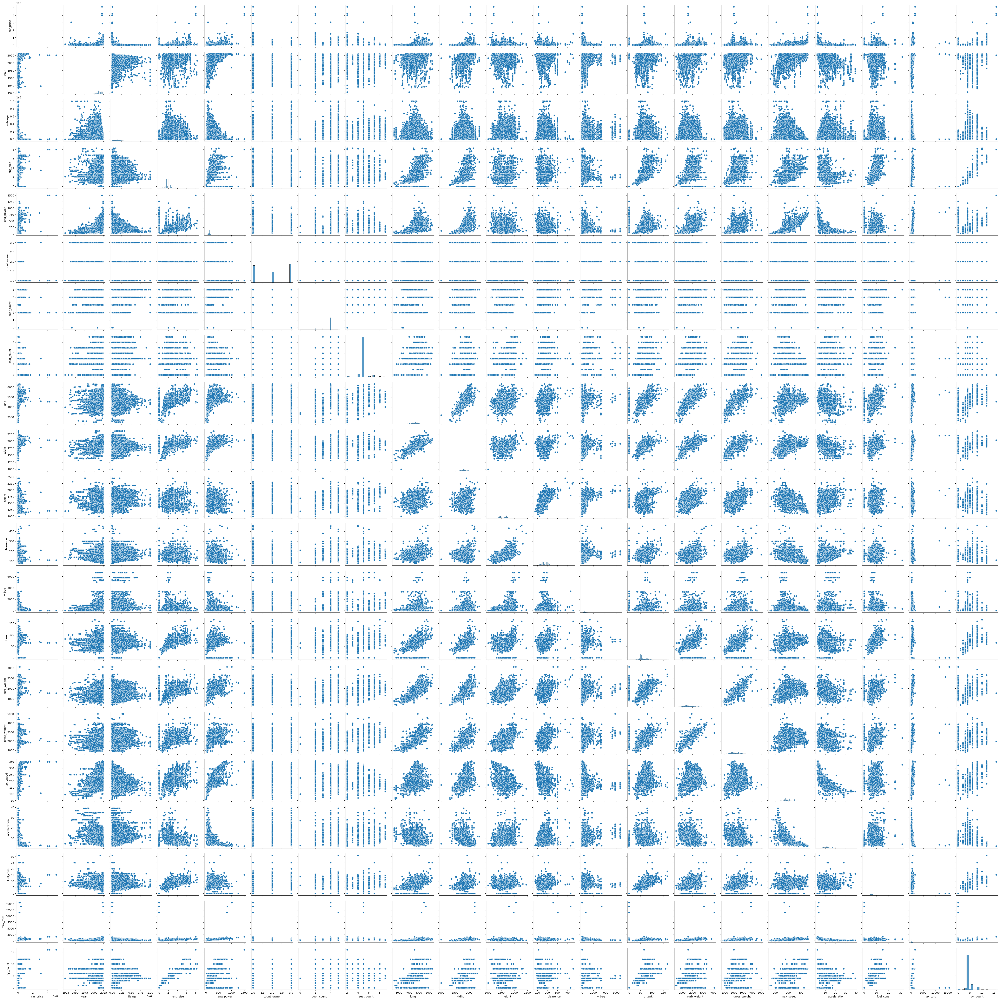

In [1885]:
sns.pairplot(df_train)

#### Рассмотрим попарные корреляции числовых признаков и таргета

<Axes: >

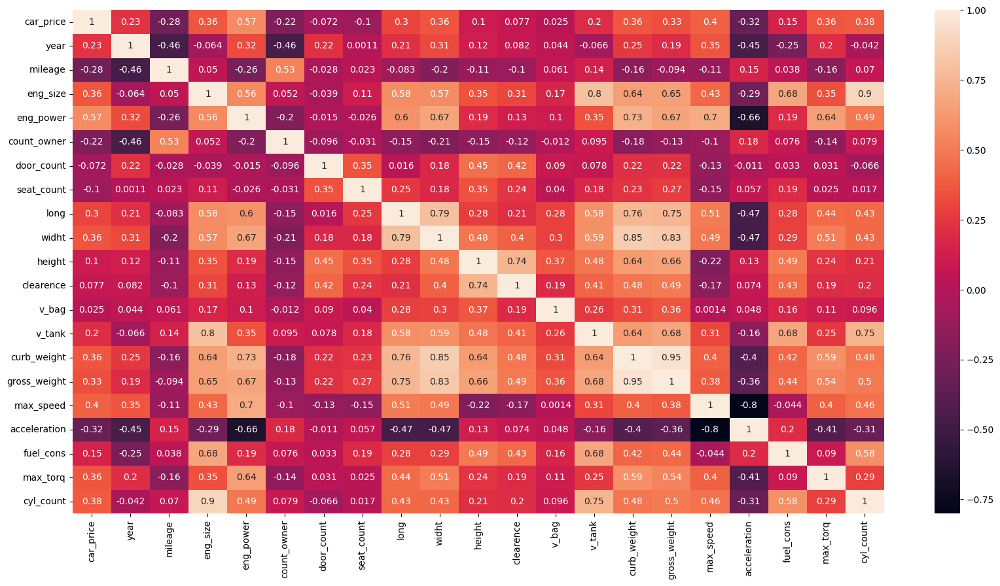

In [1886]:
df_corr = df_train.select_dtypes(['int', 'float'])
plt.figure(figsize= (20,10))
sns.heatmap(df_corr.corr(), annot = True, fmt='.2g')

#### Видим сильную корреляцию между снаряженной и максимальной массой, удалим максимальную массу

In [1887]:
df_train = df_train.drop(['gross_weight'], axis=1)
df_test = df_test.drop(['gross_weight'], axis=1)

#### Сопоставим распределения числовых признаков тренировочного и тестового датасетов

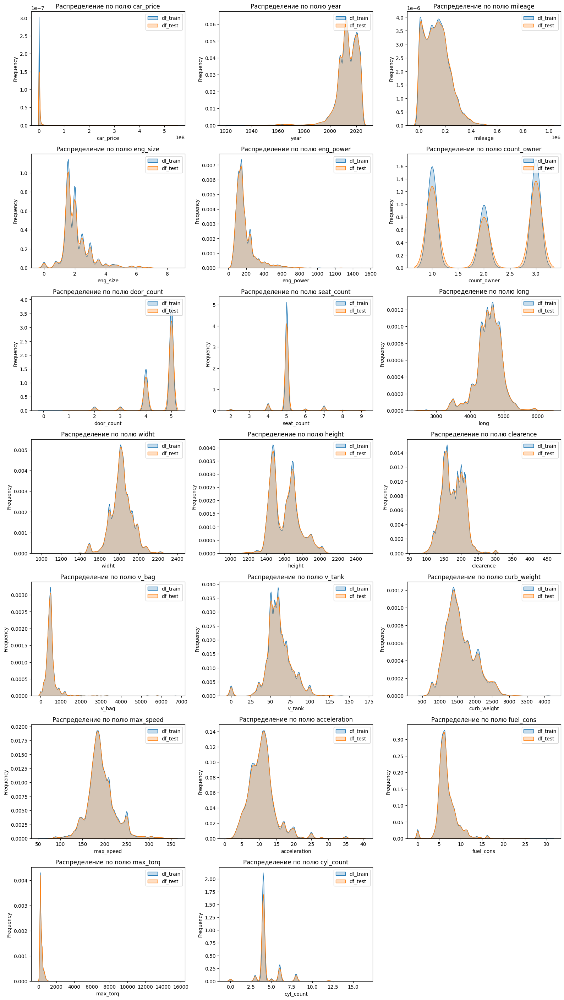

In [1888]:
numeric_cols = df_train.select_dtypes([int, float]).columns
total_axes = len(numeric_cols)
fig = plt.figure(figsize=(16, ((total_axes//3) + (total_axes % 3))*4))
for i, state in enumerate(numeric_cols):
    ax = fig.add_subplot((total_axes//3) + (total_axes % 3), 3, i+1)
    # df_state = df[df['state_mark'] == state]
    sns.kdeplot(df_train[state], fill=True, label = 'df_train')
    sns.kdeplot(df_test[state], fill=True, label = 'df_test')
    plt.title(f'Распределение по полю {state}')
    plt.legend()
    plt.xlabel(f'{state}')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

#### Посмотрим на корреляции категориальных признаков

interval columns not set, guessing: ['car_price']


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable car_model is large: 1785. Are you sure this is not an interval variable? Analysis for pairs of variables including car_model can be slow.
  warnings.warn(


<Axes: >

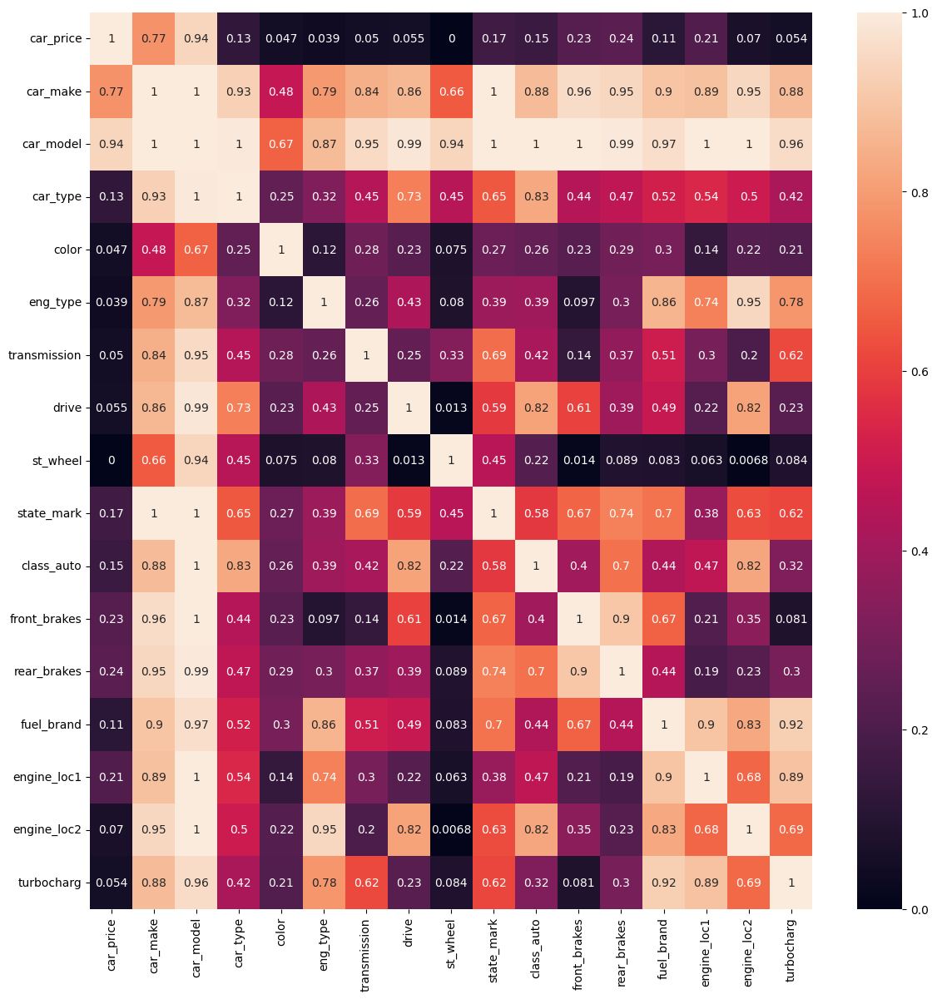

In [1890]:
import phik

plt.figure(figsize=(14,14))

columns_phik = ['car_price', 'car_make', 'car_model', 'car_type', 'color', 'eng_type', 'transmission', 'drive', 
                'st_wheel', 'state_mark', 'class_auto', 'front_brakes', 'rear_brakes', 'fuel_brand', 'engine_loc1', 'engine_loc2', 'turbocharg']

ph = df_train[columns_phik].phik_matrix()

sns.heatmap(ph, annot=True)

### **Не удаляем электрокары**

In [1583]:
# df_train = df_train.drop(df_train[df_train['eng_type'] == 'Электро'].index)
# df_test = df_test.drop(df_test[df_test['eng_type'] == 'Электро'].index)

In [1584]:
df_train = df_train.reset_index(drop=True)
df_test = df_test.reset_index(drop=True)

### **Модель на вещественных признаках**

#### Подготовим датасеты для обучения

Тренировочные данные

In [1585]:
y_train = df_train['car_price']
X_train = df_train.select_dtypes(['int', 'float']).drop('car_price', axis=1)

In [1586]:
X_train.shape

(74946, 19)

Тестовые данные

In [1587]:
y_test = df_test['car_price']
X_test = df_test.select_dtypes(['int', 'float']).drop('car_price', axis=1)

In [1588]:
X_test.shape

(25182, 19)

#### Линейная регрессия

Подключаем библиотеки

In [1589]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score, mean_squared_error as MSE, mean_absolute_error as MAE

In [1590]:
model = LinearRegression()

model.fit(X_train, y_train)

LinearRegression()

In [1591]:
def print_r2_mse(X_train, y_train, X_test, y_test, model):
    '''
    Функция принимает на вход признаки и таргет для тренировочных
    и тестовых данных, модель и выводит на экран 
    значения MSE, R^2 для трейна и теста для указанных параметров
    '''
    print('*'*20)
    print(f'Значение MAE для трейна:  {MAE(y_train, model.predict(X_train))}')
    print(f'Значение MAE для теста:   {MAE(y_test, model.predict(X_test))}')
    print('*'*20)
    print(f'Значение MSE для трейна:  {MSE(y_train, model.predict(X_train))}')
    print(f'Значение MSE для теста:   {MSE(y_test, model.predict(X_test))}')
    print('*'*20)
    print(f'Значение R^2 для трейна:  {r2_score(y_train, model.predict(X_train))}')
    print(f'Значение R^2 для теста:   {r2_score(y_test, model.predict(X_test))}')
    print('*'*20)
    score = cross_val_score(model, X_train, y_train, cv=7)
    print(f'Значения кросс-валидации:\n {score}')
    print(f'Среднее кросс-валидации:  {score.mean():.5f}')

In [1592]:
print_r2_mse(X_train, y_train, X_test, y_test, model)

********************
Значение MAE для трейна:  1675641.5593488005
Значение MAE для теста:   1696678.7327414209
********************
Значение MSE для трейна:  22508196297509.62
Значение MSE для теста:   37710658414114.125
********************
Значение R^2 для трейна:  0.39778360565231974
Значение R^2 для теста:   0.3347738238735709
********************
Значения кросс-валидации:
 [0.5308367  0.52757372 0.40358797 0.36552103 0.31936942 0.31440924
 0.48876838]
Среднее кросс-валидации:  0.42144


Как-то не очень...  
Попробуем улучшить

#### Модель со стандартизированными признаками

In [1593]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

scaler.fit(X_train)

X_train_std = scaler.transform(X_train)
X_test_std = scaler.transform(X_test)

In [1594]:
model_std = LinearRegression()
model_std.fit(X_train_std, y_train)

LinearRegression()

In [1595]:
print_r2_mse(X_train_std, y_train, X_test_std, y_test, model_std)

********************
Значение MAE для трейна:  1675641.5593488067
Значение MAE для теста:   1696678.7327414267
********************
Значение MSE для трейна:  22508196297509.63
Значение MSE для теста:   37710658414114.16
********************
Значение R^2 для трейна:  0.3977836056523196
Значение R^2 для теста:   0.33477382387357046
********************
Значения кросс-валидации:
 [0.5308367  0.52757372 0.40358797 0.36552103 0.31936942 0.31440924
 0.48876838]
Среднее кросс-валидации:  0.42144


In [1596]:
def print_coef(data, model):

  feat_weights = list(zip(data, model.coef_))
  feat_weights.sort(key=lambda x: (abs(x[1]), x[0]), reverse=True)
  for feature, weight in feat_weights:
    print(f'{feature:>40}: {weight:>20.10f}')

In [1597]:
print_coef(X_train, model_std)

                               eng_power:   3497053.6697710836
                               cyl_count:   2055501.3254896444
                             curb_weight:  -1409812.4058584475
                            acceleration:   1112584.9973714382
                                  height:    644653.6949034592
                                 mileage:   -633804.3552087481
                                eng_size:   -605080.0238146175
                             count_owner:   -461619.3640791574
                                  v_tank:   -424555.4240643252
                                    long:    398813.1370117261
                              seat_count:   -379252.9511104291
                                   widht:    316784.2353733277
                               max_speed:    298473.2615007757
                                    year:    241136.9161702351
                              door_count:   -239776.2961638544
                               fuel_cons:   -212448.872

#### Применим Лассо

In [1598]:
from sklearn.linear_model import Lasso

lasso_model = Lasso(alpha=1.0)
lasso = lasso_model.fit(X_train_std, y_train)
lasso_predict = lasso.predict(X_test_std)

In [1599]:
print_r2_mse(X_train_std, y_train, X_test_std, y_test, lasso_model)

********************
Значение MAE для трейна:  1675638.9202538035
Значение MAE для теста:   1696676.228148525
********************
Значение MSE для трейна:  22508196297624.523
Значение MSE для теста:   37710665156505.25
********************
Значение R^2 для трейна:  0.39778360564924553
Значение R^2 для теста:   0.3347737049359748
********************
Значения кросс-валидации:
 [0.53083699 0.52757376 0.4035879  0.365521   0.31936951 0.31440904
 0.48876871]
Среднее кросс-валидации:  0.42144


In [1600]:
print_coef(X_train, lasso)

                               eng_power:   3497047.9830113165
                               cyl_count:   2055486.7063710887
                             curb_weight:  -1409794.4276024327
                            acceleration:   1112576.0752979892
                                  height:    644639.6032331919
                                 mileage:   -633805.2346537778
                                eng_size:   -605065.3114077307
                             count_owner:   -461619.8325682277
                                  v_tank:   -424549.2947807121
                                    long:    398802.0975058379
                              seat_count:   -379251.8541163529
                                   widht:    316780.1913218999
                               max_speed:    298465.0331507605
                                    year:    241137.8587625556
                              door_count:   -239774.1267837204
                               fuel_cons:   -212446.931

Применим GreadSearch

In [1606]:
from sklearn.model_selection import GridSearchCV

# Определяем сетку параметров
param_grid = {
    'alpha': np.arange(740000, 750000, 100)
}

# Выполняем поиск по сетке с кросс-валидацией (ПРОВЕРИТЬ ПАРАМЕТРЫ)
lasso_gs = GridSearchCV(Lasso(), param_grid, scoring='neg_mean_absolute_error',cv=10)
lasso_gs.fit(X_train_std, y_train)

# Выводим лучшие значения параметров и оценку
print("Лучший параметр:", lasso_gs.best_params_)

Лучший параметр: {'alpha': 742400}


In [1607]:
from sklearn.linear_model import Lasso

lasso_model_cv = Lasso(alpha=742400)
lasso_cv = lasso_model_cv.fit(X_train_std, y_train)

In [1608]:
print_r2_mse(X_train_std, y_train, X_test_std, y_test, lasso_cv)

********************
Значение MAE для трейна:  1364467.5374631593
Значение MAE для теста:   1400425.0897267708
********************
Значение MSE для трейна:  25048688553012.777
Значение MSE для теста:   42042145008565.266
********************
Значение R^2 для трейна:  0.32981165153591674
Значение R^2 для теста:   0.25836523316354565
********************
Значения кросс-валидации:
 [0.4779158  0.44187701 0.32789246 0.29210588 0.28936879 0.23479454
 0.45416893]
Среднее кросс-валидации:  0.35973


In [1609]:
print_coef(X_train, lasso_cv)

                               eng_power:   2421925.9017327870
                               cyl_count:    410806.6063141978
                                 mileage:   -363820.6124433942
                                    year:         0.0000000000
                                   widht:         0.0000000000
                                  v_tank:         0.0000000000
                                   v_bag:        -0.0000000000
                              seat_count:        -0.0000000000
                                max_torq:         0.0000000000
                               max_speed:         0.0000000000
                                    long:         0.0000000000
                                  height:         0.0000000000
                               fuel_cons:         0.0000000000
                                eng_size:         0.0000000000
                              door_count:        -0.0000000000
                             curb_weight:         0.000

#### Применим ElasticNet

In [1610]:
from sklearn.linear_model import ElasticNet

elastic = ElasticNet()

param_grid = {
    'alpha':np.arange(1, 3, 0.1),
    'l1_ratio':np.arange(0.01, 0.1, 0.05)}

elastic_cv = GridSearchCV(elastic,
                          param_grid,
                          scoring='neg_mean_absolute_error',
                          cv = 10,
                          verbose=1)

elastic_cv.fit(X_train_std, y_train)

# Выводим лучшие значения параметров и оценку
print("Лучший параметр:", elastic_cv.best_params_)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Лучший параметр: {'alpha': 2.200000000000001, 'l1_ratio': 0.060000000000000005}


In [1611]:
elastic_best = ElasticNet(alpha = 2.2, l1_ratio=0.06)
elastic_best.fit(X_train_std, y_train)

ElasticNet(alpha=2.2, l1_ratio=0.06)

In [1612]:
print_r2_mse(X_train_std, y_train, X_test_std, y_test, elastic_best)

********************
Значение MAE для трейна:  1430170.607668681
Значение MAE для теста:   1465998.0489198808
********************
Значение MSE для трейна:  26414641396186.64
Значение MSE для теста:   44064773514032.63
********************
Значение R^2 для трейна:  0.2932650004763584
Значение R^2 для теста:   0.22268552129957075
********************
Значения кросс-валидации:
 [0.44576722 0.39865045 0.28620379 0.2588744  0.26416404 0.19393834
 0.42279781]
Среднее кросс-валидации:  0.32434


#### Добавим категориальные фичи

In [1613]:
X_train_cat = df_train.copy()
X_test_cat = df_test.copy()
y_train_cat = X_train_cat['car_price']
y_test_cat = X_test_cat['car_price']
X_train_cat = X_train_cat.drop(['car_price', 'car_model', 'car_gen', 'car_compl'], axis=1)
X_test_cat = X_test_cat.drop(['car_price','car_model', 'car_gen', 'car_compl'], axis=1)

In [1614]:
X_train_cat.describe(include='object')

,car_make,car_type,color,eng_type,transmission,drive,st_wheel,state_mark,class_auto,front_brakes,rear_brakes,fuel_brand,engine_loc1,engine_loc2,turbocharg
count,74946,74946,74946,74946,74946,74946,74946,74946,74946,74946,74946,74946,74946,74946,74946
unique,202,23,16,9,4,3,2,24,9,3,3,8,4,3,4
top,Porsche,Внедорожник 5 дв.,чёрный,Бензин,автоматическая,передний,Левый,Япония,C,дисковые,дисковые,АИ-95,переднее,поперечное,нет
freq,2352,34658,17962,61548,35990,38401,72103,16409,20903,73601,56427,44051,73108,50337,43377


In [1615]:
df_train['count_owner'].value_counts()

count_owner
3    29818
1    27851
2    17277
Name: count, dtype: int64

In [1616]:
columns_object = X_train_cat.select_dtypes(include='object').columns.tolist()
replace_dict = dict()
for column in columns_object:
    X = set(X_train_cat[column].unique().tolist())
    Y = set(X_test_cat[column].unique().tolist())
    if X - Y:
        print(f'Нет в тесте {column}: {X - Y}')
    if Y - X:
        print(f'Нет в трэйне {column}: {Y - X}')
        replace_dict[column] = list(Y - X)

replace_dict

Нет в тесте car_make: {'Exlantix', 'Packard', 'Yulon', 'Knewstar', 'Changfeng', 'Adler', 'СМЗ', 'Tofas', 'Sandstorm', 'Dayun', 'Simca', 'Mitsuoka', 'Morgan', 'Tianma', 'Lucid', 'Bajaj', 'Austin', 'Daimler', 'ShuangHuan', 'Delage', 'Qoros', 'Eagle', 'Ariel', 'Abarth', 'Everus', 'Coda', 'Metrocab', 'Канонир', 'Aixam', 'Baltijas Dzips', 'Alpine', 'Landwind', 'Enovate (Enoreve)', 'LEVC', 'Maple', 'Aro', 'Liebao Motor', 'Aurus', 'Yema', 'Mahindra', 'Puch', 'Steyr'}
Нет в трэйне car_make: {'AC', 'Kawei', 'TVR', 'Geo', 'Stelato', 'Комбат', 'Excalibur', 'Ambertruck', 'Facel Vega', 'Pagani'}
Нет в тесте car_type: {'Хэтчбек 4 дв.', 'Спидстер'}
Нет в трэйне car_type: {'Универсал 3 дв.'}
Нет в тесте state_mark: {'Турция', 'Латвия', 'Австрия', 'Объединённые Арабские Эмираты'}


{'car_make': ['AC',
  'Kawei',
  'TVR',
  'Geo',
  'Stelato',
  'Комбат',
  'Excalibur',
  'Ambertruck',
  'Facel Vega',
  'Pagani'],
 'car_type': ['Универсал 3 дв.']}

Заменим в самых распространенных в соответствующих категориях зназначения на недостающие (брутфорсим :)

In [1617]:
for key, value in replace_dict.items():
    top = X_train_cat[key].value_counts().index[0]
    for i, val in enumerate(value):
        X_train_cat.loc[i,key] = val

In [1618]:
columns_object = X_train_cat.select_dtypes(include='object').columns.tolist()
replace_dict = dict()
for column in columns_object:
    X = set(X_train_cat[column].unique().tolist())
    Y = set(X_test_cat[column].unique().tolist())
    if X - Y:
        print(f'Нет в тесте {column}: {X - Y}')
    if Y - X:
        print(f'Нет в трэйне {column}: {Y - X}')
        replace_dict[column] = list(Y - X)

Нет в тесте car_make: {'Exlantix', 'Packard', 'Yulon', 'Knewstar', 'Changfeng', 'Adler', 'СМЗ', 'Tofas', 'Sandstorm', 'Dayun', 'Simca', 'Mitsuoka', 'Morgan', 'Tianma', 'Lucid', 'Bajaj', 'Austin', 'Daimler', 'ShuangHuan', 'Delage', 'Qoros', 'Eagle', 'Ariel', 'Abarth', 'Everus', 'Coda', 'Metrocab', 'Канонир', 'Aixam', 'Baltijas Dzips', 'Alpine', 'Landwind', 'Enovate (Enoreve)', 'LEVC', 'Maple', 'Aro', 'Liebao Motor', 'Aurus', 'Yema', 'Mahindra', 'Puch', 'Steyr'}
Нет в тесте car_type: {'Хэтчбек 4 дв.', 'Спидстер'}
Нет в тесте state_mark: {'Турция', 'Латвия', 'Австрия', 'Объединённые Арабские Эмираты'}


In [1619]:
X_train_cat.select_dtypes(include='object')

,car_make,car_type,color,eng_type,transmission,drive,st_wheel,state_mark,class_auto,front_brakes,rear_brakes,fuel_brand,engine_loc1,engine_loc2,turbocharg
0,AC,Универсал 3 дв.,серый,Бензин,вариатор,полный,Левый,Япония,B,дисковые,дисковые,АИ-95,переднее,поперечное,нет
1,Kawei,Седан,белый,Бензин,механическая,передний,Левый,Япония,C,дисковые,дисковые,АИ-95,переднее,поперечное,нет
2,TVR,Внедорожник 5 дв.,коричневый,Бензин,автоматическая,полный,Левый,Германия,E,дисковые,дисковые,АИ-98,переднее,продольное,нет
3,Geo,Седан,чёрный,Бензин,автоматическая,передний,Левый,Франция,D,дисковые,дисковые,АИ-95,переднее,поперечное,нет
4,Stelato,Внедорожник 5 дв.,белый,Бензин,вариатор,полный,Левый,Япония,C,дисковые,дисковые,АИ-92,переднее,поперечное,нет
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74941,BMW,Внедорожник 5 дв.,серый,Дизель,автоматическая,полный,Левый,Германия,E,дисковые,дисковые,ДТ,переднее,продольное,турбонаддув
74942,Mitsubishi,Внедорожник 5 дв.,белый,Бензин,вариатор,полный,Левый,Япония,D,дисковые,дисковые,АИ-92,переднее,поперечное,нет
74943,Skoda,Лифтбек,серый,Бензин,роботизированная,передний,Левый,Чехия,C,дисковые,дисковые,АИ-95,переднее,поперечное,турбонаддув
74944,Audi,Седан,белый,Бензин,вариатор,передний,Левый,Германия,D,дисковые,дисковые,АИ-95,переднее,продольное,турбонаддув


In [1620]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

enc = OneHotEncoder(drop='first')
columns_list = X_train_cat.select_dtypes(include='object').columns.tolist()
enc_fit = enc.fit(X_train_cat[columns_list])

encoded_train = enc.fit_transform(X_train_cat[columns_list]).toarray()
encoded_train = pd.DataFrame(encoded_train, columns=enc.get_feature_names_out())
X_train_cat = pd.concat([X_train_cat, encoded_train], axis=1).drop(columns=columns_list)
enc_names = encoded_train.columns
print(enc_names)
print(X_train_cat.columns)
X_train_cat.head(5)

Index(['car_make_Abarth', 'car_make_Acura', 'car_make_Adler', 'car_make_Aito',
       'car_make_Aixam', 'car_make_Alfa Romeo', 'car_make_Alpina',
       'car_make_Alpine', 'car_make_Ambertruck', 'car_make_Arcfox',
       ...
       'fuel_brand_Газ (Бензин)', 'fuel_brand_ДТ', 'engine_loc1_заднее',
       'engine_loc1_переднее', 'engine_loc1_центральное',
       'engine_loc2_поперечное', 'engine_loc2_продольное',
       'turbocharg_компрессор', 'turbocharg_нет', 'turbocharg_турбонаддув'],
      dtype='object', length=313)
Index(['year', 'mileage', 'eng_size', 'eng_power', 'count_owner', 'door_count',
       'seat_count', 'long', 'widht', 'height',
       ...
       'fuel_brand_Газ (Бензин)', 'fuel_brand_ДТ', 'engine_loc1_заднее',
       'engine_loc1_переднее', 'engine_loc1_центральное',
       'engine_loc2_поперечное', 'engine_loc2_продольное',
       'turbocharg_компрессор', 'turbocharg_нет', 'turbocharg_турбонаддув'],
      dtype='object', length=332)


,year,mileage,eng_size,eng_power,count_owner,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,max_speed,acceleration,fuel_cons,max_torq,cyl_count,car_make_Abarth,car_make_Acura,car_make_Adler,car_make_Aito,car_make_Aixam,car_make_Alfa Romeo,car_make_Alpina,car_make_Alpine,car_make_Ambertruck,car_make_Arcfox,car_make_Ariel,car_make_Aro,car_make_Asia,car_make_Aston Martin,car_make_Audi,car_make_Aurus,car_make_Austin,car_make_Avatr,car_make_BAIC,car_make_BAW,car_make_BMW,car_make_BYD,car_make_Bajaj,car_make_Baltijas Dzips,car_make_Baojun,car_make_Belgee,car_make_Bentley,car_make_Brilliance,car_make_Bugatti,car_make_Buick,car_make_CHERY,car_make_Cadillac,car_make_Changan,car_make_Changfeng,car_make_Chevrolet,car_make_Chrysler,car_make_Ciimo (Dongfeng-Honda),car_make_Citroen,car_make_Coda,car_make_Cupra,car_make_DS,car_make_DW Hower,car_make_Dacia,car_make_Dadi,car_make_Daewoo,car_make_Daihatsu,car_make_Daimler,car_make_Datsun,car_make_Dayun,car_make_Delage,car_make_Denza,car_make_Derways,car_make_Dodge,car_make_Dongfeng,car_make_Doninvest,car_make_EXEED,car_make_Eagle,car_make_Enovate (Enoreve),car_make_Everus,car_make_Evolute,car_make_Excalibur,car_make_Exlantix,car_make_FAW,car_make_FSO,car_make_Facel Vega,car_make_Ferrari,car_make_Fiat,car_make_Ford,car_make_Forthing,car_make_Foton,car_make_GAC,car_make_GAC Aion,car_make_GAC Trumpchi,car_make_GMC,car_make_Geely,car_make_Genesis,car_make_Geo,car_make_Great Wall,car_make_Hafei,car_make_Haima,car_make_KG Mobility,car_make_Kaiyi,car_make_Kawei,car_make_Kia,car_make_Knewstar,car_make_LEVC,car_make_Lada (ВАЗ),car_make_Lamborghini,car_make_Lancia,car_make_Land Rover,car_make_Landwind,car_make_Leapmotor,car_make_Lexus,car_make_LiXiang,car_make_Liebao Motor,car_make_Lifan,car_make_Lincoln,car_make_Livan,car_make_Lotus,car_make_Lucid,car_make_Luxeed,car_make_Luxgen,car_make_Lynk & Co,car_make_M-Hero,car_make_MG,car_make_Mahindra,car_make_Maple,car_make_Maserati,car_make_Maxus,car_make_Maybach,car_make_Mazda,car_make_McLaren,car_make_Mercedes-Benz,car_make_Mercury,car_make_Metrocab,car_make_Mini,car_make_Mitsubishi,car_make_Mitsuoka,car_make_Morgan,car_make_Nevo,car_make_Nio,car_make_Nissan,car_make_OMODA,car_make_Oldsmobile,car_make_Opel,car_make_Ora,car_make_Oshan,car_make_Oting,car_make_Packard,car_make_Pagani,car_make_Peugeot,car_make_Plymouth,car_make_Polar Stone (Jishi),car_make_Polestar,car_make_Pontiac,car_make_Porsche,car_make_Proton,car_make_Puch,car_make_Qoros,car_make_Ram,car_make_Ravon,car_make_Renault,car_make_Renault Samsung,car_make_Rivian,car_make_Roewe,car_make_Rolls-Royce,car_make_Rover,car_make_SEAT,car_make_SWM,car_make_Saab,car_make_Sandstorm,car_make_Saturn,car_make_Scion,car_make_Seres,car_make_ShuangHuan,car_make_Simca,car_make_Skoda,car_make_Skywell,car_make_Smart,car_make_Solaris,car_make_Sollers,car_make_Soueast,car_make_SsangYong,car_make_Stelato,car_make_Steyr,car_make_Subaru,car_make_Suzuki,car_make_TVR,car_make_Tank,car_make_Tata,car_make_Tatra,car_make_Tesla,car_make_Tianma,car_make_Tianye,car_make_Tofas,car_make_Toyota,car_make_Trabant,car_make_VGV,car_make_Vauxhall,car_make_Venucia,car_make_Volkswagen,car_make_Volvo,car_make_Vortex,car_make_Voyah,car_make_Wanderer,car_make_Wartburg,car_make_Weltmeister,car_make_Wey,car_make_Willys,car_make_Wuling,car_make_Xcite,car_make_Xiaomi,car_make_Xin Kai,car_make_Xpeng,car_make_Yema,car_make_Yulon,car_make_ZX,car_make_Zeekr,car_make_Zotye,car_make_ГАЗ,car_make_ЗАЗ,car_make_ЗИЛ,car_make_ЗиС,car_make_Канонир,car_make_Комбат,car_make_ЛуАЗ,car_make_Москвич,car_make_СМЗ,car_make_Спортивные авто и реплики,car_make_ТагАЗ,car_make_УАЗ,car_type_Внедорожник 5 дв.,car_type_Внедорожник открытый,car_type_Кабриолет,car_type_Компактвэн,car_type_Купе,car_type_Лимузин,car_type_Лифтбек,car_type_Микровэн,car_type_Минивэн,car_type_Пикап Двойная кабина,car_type_Пикап Одинарная кабина,car_type_Пикап Полуторная кабина,car_type_Родстер,car_type_Седан,car_type_Спидстер,car_type_Тарга,car_type_Универсал 3 дв.,car_t

In [1621]:
encoded = enc.transform(X_test_cat[columns_list]).toarray()
encoded = pd.DataFrame(encoded, columns=enc.get_feature_names_out())
X_test_cat = pd.concat([X_test_cat, encoded], axis=1).drop(columns=columns_list)

print(X_test_cat.columns)
X_test_cat.head(5)

Index(['year', 'mileage', 'eng_size', 'eng_power', 'count_owner', 'door_count',
       'seat_count', 'long', 'widht', 'height',
       ...
       'fuel_brand_Газ (Бензин)', 'fuel_brand_ДТ', 'engine_loc1_заднее',
       'engine_loc1_переднее', 'engine_loc1_центральное',
       'engine_loc2_поперечное', 'engine_loc2_продольное',
       'turbocharg_компрессор', 'turbocharg_нет', 'turbocharg_турбонаддув'],
      dtype='object', length=332)


,year,mileage,eng_size,eng_power,count_owner,door_count,seat_count,long,widht,height,clearence,v_bag,v_tank,curb_weight,max_speed,acceleration,fuel_cons,max_torq,cyl_count,car_make_Abarth,car_make_Acura,car_make_Adler,car_make_Aito,car_make_Aixam,car_make_Alfa Romeo,car_make_Alpina,car_make_Alpine,car_make_Ambertruck,car_make_Arcfox,car_make_Ariel,car_make_Aro,car_make_Asia,car_make_Aston Martin,car_make_Audi,car_make_Aurus,car_make_Austin,car_make_Avatr,car_make_BAIC,car_make_BAW,car_make_BMW,car_make_BYD,car_make_Bajaj,car_make_Baltijas Dzips,car_make_Baojun,car_make_Belgee,car_make_Bentley,car_make_Brilliance,car_make_Bugatti,car_make_Buick,car_make_CHERY,car_make_Cadillac,car_make_Changan,car_make_Changfeng,car_make_Chevrolet,car_make_Chrysler,car_make_Ciimo (Dongfeng-Honda),car_make_Citroen,car_make_Coda,car_make_Cupra,car_make_DS,car_make_DW Hower,car_make_Dacia,car_make_Dadi,car_make_Daewoo,car_make_Daihatsu,car_make_Daimler,car_make_Datsun,car_make_Dayun,car_make_Delage,car_make_Denza,car_make_Derways,car_make_Dodge,car_make_Dongfeng,car_make_Doninvest,car_make_EXEED,car_make_Eagle,car_make_Enovate (Enoreve),car_make_Everus,car_make_Evolute,car_make_Excalibur,car_make_Exlantix,car_make_FAW,car_make_FSO,car_make_Facel Vega,car_make_Ferrari,car_make_Fiat,car_make_Ford,car_make_Forthing,car_make_Foton,car_make_GAC,car_make_GAC Aion,car_make_GAC Trumpchi,car_make_GMC,car_make_Geely,car_make_Genesis,car_make_Geo,car_make_Great Wall,car_make_Hafei,car_make_Haima,car_make_KG Mobility,car_make_Kaiyi,car_make_Kawei,car_make_Kia,car_make_Knewstar,car_make_LEVC,car_make_Lada (ВАЗ),car_make_Lamborghini,car_make_Lancia,car_make_Land Rover,car_make_Landwind,car_make_Leapmotor,car_make_Lexus,car_make_LiXiang,car_make_Liebao Motor,car_make_Lifan,car_make_Lincoln,car_make_Livan,car_make_Lotus,car_make_Lucid,car_make_Luxeed,car_make_Luxgen,car_make_Lynk & Co,car_make_M-Hero,car_make_MG,car_make_Mahindra,car_make_Maple,car_make_Maserati,car_make_Maxus,car_make_Maybach,car_make_Mazda,car_make_McLaren,car_make_Mercedes-Benz,car_make_Mercury,car_make_Metrocab,car_make_Mini,car_make_Mitsubishi,car_make_Mitsuoka,car_make_Morgan,car_make_Nevo,car_make_Nio,car_make_Nissan,car_make_OMODA,car_make_Oldsmobile,car_make_Opel,car_make_Ora,car_make_Oshan,car_make_Oting,car_make_Packard,car_make_Pagani,car_make_Peugeot,car_make_Plymouth,car_make_Polar Stone (Jishi),car_make_Polestar,car_make_Pontiac,car_make_Porsche,car_make_Proton,car_make_Puch,car_make_Qoros,car_make_Ram,car_make_Ravon,car_make_Renault,car_make_Renault Samsung,car_make_Rivian,car_make_Roewe,car_make_Rolls-Royce,car_make_Rover,car_make_SEAT,car_make_SWM,car_make_Saab,car_make_Sandstorm,car_make_Saturn,car_make_Scion,car_make_Seres,car_make_ShuangHuan,car_make_Simca,car_make_Skoda,car_make_Skywell,car_make_Smart,car_make_Solaris,car_make_Sollers,car_make_Soueast,car_make_SsangYong,car_make_Stelato,car_make_Steyr,car_make_Subaru,car_make_Suzuki,car_make_TVR,car_make_Tank,car_make_Tata,car_make_Tatra,car_make_Tesla,car_make_Tianma,car_make_Tianye,car_make_Tofas,car_make_Toyota,car_make_Trabant,car_make_VGV,car_make_Vauxhall,car_make_Venucia,car_make_Volkswagen,car_make_Volvo,car_make_Vortex,car_make_Voyah,car_make_Wanderer,car_make_Wartburg,car_make_Weltmeister,car_make_Wey,car_make_Willys,car_make_Wuling,car_make_Xcite,car_make_Xiaomi,car_make_Xin Kai,car_make_Xpeng,car_make_Yema,car_make_Yulon,car_make_ZX,car_make_Zeekr,car_make_Zotye,car_make_ГАЗ,car_make_ЗАЗ,car_make_ЗИЛ,car_make_ЗиС,car_make_Канонир,car_make_Комбат,car_make_ЛуАЗ,car_make_Москвич,car_make_СМЗ,car_make_Спортивные авто и реплики,car_make_ТагАЗ,car_make_УАЗ,car_type_Внедорожник 5 дв.,car_type_Внедорожник открытый,car_type_Кабриолет,car_type_Компактвэн,car_type_Купе,car_type_Лимузин,car_type_Лифтбек,car_type_Микровэн,car_type_Минивэн,car_type_Пикап Двойная кабина,car_type_Пикап Одинарная кабина,car_type_Пикап Полуторная кабина,car_type_Родстер,car_type_Седан,car_type_Спидстер,car_type_Тарга,car_type_Универсал 3 дв.,car_t

In [1622]:
sc = StandardScaler()

sc_fit = sc.fit(X_train_cat)
sc_name = sc.get_feature_names_out()

X_train_cat_std = pd.DataFrame(sc.transform(X_train_cat))
X_test_cat_std = pd.DataFrame(sc.transform(X_test_cat))

In [1623]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()

ridge_cv = GridSearchCV(ridge,{"alpha": np.arange(2400, 2600, 50)}, scoring='r2', verbose=1, cv = 10)

ridge_cv_train = ridge_cv.fit(X_train_cat_std, y_train_cat)

# Выводим лучшие значения параметров и оценку
print("Лучший параметр:", ridge_cv_train.best_params_)

Fitting 10 folds for each of 4 candidates, totalling 40 fits
Лучший параметр: {'alpha': 2450}


In [1624]:
ridge_best = Ridge(alpha = 2450)
ridge_best.fit(X_train_cat_std, y_train_cat)

Ridge(alpha=2450)

In [1625]:
print_r2_mse(X_train_cat_std, y_train_cat, X_test_cat_std, y_test_cat, ridge_best)

********************
Значение MAE для трейна:  1139611.9523276095
Значение MAE для теста:   1162561.7578565588
********************
Значение MSE для трейна:  10668682219894.746
Значение MSE для теста:   17919830321001.324
********************
Значение R^2 для трейна:  0.7145548557519429
Значение R^2 для теста:   0.6838893643709885
********************
Значения кросс-валидации:
 [0.73831945 0.73019957 0.79903153 0.76877272 0.46606582 0.77578974
 0.1163189 ]
Среднее кросс-валидации:  0.62779


In [1626]:
print_coef(X_train_cat, ridge_best)

                        car_make_Bugatti:   2586205.3682330577
                               eng_power:   2041435.7545887993
                    car_make_Rolls-Royce:   1678269.6811815128
                                    year:    730666.4430919867
                rear_brakes_керамические:    626910.1735278005
                                eng_size:   -597386.7975075654
                        car_make_Ferrari:    590896.4986614578
                                 mileage:   -568580.1286624651
                            car_make_ЗиС:    563818.3634799100
                          drive_передний:    446313.8607036323
                                  height:    435998.9203899853
                                    long:    407205.3490829118
                            car_make_УАЗ:   -366156.1269284679
                                   widht:    363497.1292361131
                      engine_loc1_заднее:    348176.6017894699
                            drive_полный:    332616.047

### **Попробуем улучшить модель**

#### Добавим полиномиальные признаки

Создадим копию датасета для полиномиальной модели

In [1627]:
X_train_poly = df_train.copy()
X_test_poly = df_test.copy()
X_train_poly = X_train_poly.drop(['car_price'], axis=1)
X_test_poly = X_test_poly.drop(['car_price'], axis=1)

Добавим полиномиальные признаки второй степени

In [1628]:
from sklearn.preprocessing import PolynomialFeatures

pf = PolynomialFeatures(degree = 2)
columns_poly = X_train.select_dtypes([int, float]).columns
pf_fit = pf.fit(X_train_poly[columns_poly])
pf_names = pf.get_feature_names_out()

poly = pf.fit_transform(X_train_poly[columns_poly])
poly = pd.DataFrame(poly, columns = pf.get_feature_names_out())
X_train_poly = pd.concat([X_train_poly, poly], axis=1).drop(columns=columns_poly)

print(X_train_poly.columns)
X_train_poly.head(5)

Index(['car_make', 'car_model', 'car_gen', 'car_type', 'car_compl', 'color',
       'eng_type', 'transmission', 'drive', 'st_wheel',
       ...
       'acceleration^2', 'acceleration fuel_cons', 'acceleration max_torq',
       'acceleration cyl_count', 'fuel_cons^2', 'fuel_cons max_torq',
       'fuel_cons cyl_count', 'max_torq^2', 'max_torq cyl_count',
       'cyl_count^2'],
      dtype='object', length=209)


,car_make,car_model,car_gen,car_type,car_compl,color,eng_type,transmission,drive,st_wheel,state_mark,class_auto,front_brakes,rear_brakes,fuel_brand,engine_loc1,engine_loc2,turbocharg,1,year^2,year mileage,year eng_size,year eng_power,year count_owner,year door_count,year seat_count,year long,year widht,year height,year clearence,year v_bag,year v_tank,year curb_weight,year max_speed,year acceleration,year fuel_cons,year max_torq,year cyl_count,mileage^2,mileage eng_size,mileage eng_power,mileage count_owner,mileage door_count,mileage seat_count,mileage long,mileage widht,mileage height,mileage clearence,mileage v_bag,mileage v_tank,mileage curb_weight,mileage max_speed,mileage acceleration,mileage fuel_cons,mileage max_torq,mileage cyl_count,eng_size^2,eng_size eng_power,eng_size count_owner,eng_size door_count,eng_size seat_count,eng_size long,eng_size widht,eng_size height,eng_size clearence,eng_size v_bag,eng_size v_tank,eng_size curb_weight,eng_size max_speed,eng_size acceleration,eng_size fuel_cons,eng_size max_torq,eng_size cyl_count,eng_power^2,eng_power count_owner,eng_power door_count,eng_power seat_count,eng_power long,eng_power widht,eng_power height,eng_power clearence,eng_power v_bag,eng_power v_tank,eng_power curb_weight,eng_power max_speed,eng_power acceleration,eng_power fuel_cons,eng_power max_torq,eng_power cyl_count,count_owner^2,count_owner door_count,count_owner seat_count,count_owner long,count_owner widht,count_owner height,count_owner clearence,count_owner v_bag,count_owner v_tank,count_owner curb_weight,count_owner max_speed,count_owner acceleration,count_owner fuel_cons,count_owner max_torq,count_owner cyl_count,door_count^2,door_count seat_count,door_count long,door_count widht,door_count height,door_count clearence,door_count v_bag,door_count v_tank,door_count curb_weight,door_count max_speed,door_count acceleration,door_count fuel_cons,door_count max_torq,door_count cyl_count,seat_count^2,seat_count long,seat_count widht,seat_count height,seat_count clearence,seat_count v_bag,seat_count v_tank,seat_count curb_weight,seat_count max_speed,seat_count acceleration,seat_count fuel_cons,seat_count max_torq,seat_count cyl_count,long^2,long widht,long height,long clearence,long v_bag,long v_tank,long curb_weight,long max_speed,long acceleration,long fuel_cons,long max_torq,long cyl_count,widht^2,widht height,widht clearence,widht v_bag,widht v_tank,widht curb_weight,widht max_speed,widht acceleration,widht fuel_cons,widht max_torq,widht cyl_count,height^2,height clearence,height v_bag,height v_tank,height curb_weight,height max_speed,height acceleration,height fuel_cons,height max_torq,height cyl_count,clearence^2,clearence v_bag,clearence v_tank,clearence curb_weight,clearence max_speed,clearence acceleration,clearence fuel_cons,clearence max_torq,clearence cyl_count,v_bag^2,v_bag v_tank,v_bag curb_weight,v_bag max_speed,v_bag acceleration,v_bag fuel_cons,v_bag max_torq,v_bag cyl_count,v_tank^2,v_tank curb_weight,v_tank max_speed,v_tank acceleration,v_tank fuel_cons,v_tank max_torq,v_tank cyl_count,curb_weight^2,curb_weight max_speed,curb_weight acceleration,curb_weight fuel_cons,curb_weight max_torq,curb_weight cyl_count,max_speed^2,max_speed acceleration,max_speed fuel_cons,max_speed max_torq,max_speed cyl_count,acceleration^2,acceleration fuel_cons,acceleration max_torq,acceleration cyl_count,fuel_cons^2,fuel_cons max_torq,fuel_cons cyl_count,max_torq^2,max_torq cyl_count,cyl_count^2
0,Suzuki,SX4,II (S-Cross),Хэтчбек 5 дв.,1.6 CVT (117 л.с.) 4WD,серый,Бензин,вариатор,полный,Левый,Япония,B,дисковые,дисковые,АИ-95,переднее,поперечное,нет,1.0,4056196.0,569962000.0,3222.4,235638.0,2014.0,10070.0,10070.0,8660200.0,3554710.0,3202260.0,352450.0,866020.0,94658.0,2396660.0,332310.0,27189.0,10070.0,314184.0,8056.0,8.008900e+10,452800.0,33111000.0,283000.0,1415000.0,1415000.0,1.216900e+09,499495000.0,449970000.0,49525000.0,121690000.0,13301000.0,336770000.0,46695000.0,3820500.0,1415000.0,44148000.0,1132000.0,2.56

In [1629]:
poly = pf.transform(X_test_poly[columns_poly])
poly = pd.DataFrame(poly, columns = pf.get_feature_names_out())
X_test_poly = pd.concat([X_test_poly, poly], axis=1).drop(columns=columns_poly)

print(X_test_poly.columns)
X_test_poly.head(5)

Index(['car_make', 'car_model', 'car_gen', 'car_type', 'car_compl', 'color',
       'eng_type', 'transmission', 'drive', 'st_wheel',
       ...
       'acceleration^2', 'acceleration fuel_cons', 'acceleration max_torq',
       'acceleration cyl_count', 'fuel_cons^2', 'fuel_cons max_torq',
       'fuel_cons cyl_count', 'max_torq^2', 'max_torq cyl_count',
       'cyl_count^2'],
      dtype='object', length=209)


,car_make,car_model,car_gen,car_type,car_compl,color,eng_type,transmission,drive,st_wheel,state_mark,class_auto,front_brakes,rear_brakes,fuel_brand,engine_loc1,engine_loc2,turbocharg,1,year^2,year mileage,year eng_size,year eng_power,year count_owner,year door_count,year seat_count,year long,year widht,year height,year clearence,year v_bag,year v_tank,year curb_weight,year max_speed,year acceleration,year fuel_cons,year max_torq,year cyl_count,mileage^2,mileage eng_size,mileage eng_power,mileage count_owner,mileage door_count,mileage seat_count,mileage long,mileage widht,mileage height,mileage clearence,mileage v_bag,mileage v_tank,mileage curb_weight,mileage max_speed,mileage acceleration,mileage fuel_cons,mileage max_torq,mileage cyl_count,eng_size^2,eng_size eng_power,eng_size count_owner,eng_size door_count,eng_size seat_count,eng_size long,eng_size widht,eng_size height,eng_size clearence,eng_size v_bag,eng_size v_tank,eng_size curb_weight,eng_size max_speed,eng_size acceleration,eng_size fuel_cons,eng_size max_torq,eng_size cyl_count,eng_power^2,eng_power count_owner,eng_power door_count,eng_power seat_count,eng_power long,eng_power widht,eng_power height,eng_power clearence,eng_power v_bag,eng_power v_tank,eng_power curb_weight,eng_power max_speed,eng_power acceleration,eng_power fuel_cons,eng_power max_torq,eng_power cyl_count,count_owner^2,count_owner door_count,count_owner seat_count,count_owner long,count_owner widht,count_owner height,count_owner clearence,count_owner v_bag,count_owner v_tank,count_owner curb_weight,count_owner max_speed,count_owner acceleration,count_owner fuel_cons,count_owner max_torq,count_owner cyl_count,door_count^2,door_count seat_count,door_count long,door_count widht,door_count height,door_count clearence,door_count v_bag,door_count v_tank,door_count curb_weight,door_count max_speed,door_count acceleration,door_count fuel_cons,door_count max_torq,door_count cyl_count,seat_count^2,seat_count long,seat_count widht,seat_count height,seat_count clearence,seat_count v_bag,seat_count v_tank,seat_count curb_weight,seat_count max_speed,seat_count acceleration,seat_count fuel_cons,seat_count max_torq,seat_count cyl_count,long^2,long widht,long height,long clearence,long v_bag,long v_tank,long curb_weight,long max_speed,long acceleration,long fuel_cons,long max_torq,long cyl_count,widht^2,widht height,widht clearence,widht v_bag,widht v_tank,widht curb_weight,widht max_speed,widht acceleration,widht fuel_cons,widht max_torq,widht cyl_count,height^2,height clearence,height v_bag,height v_tank,height curb_weight,height max_speed,height acceleration,height fuel_cons,height max_torq,height cyl_count,clearence^2,clearence v_bag,clearence v_tank,clearence curb_weight,clearence max_speed,clearence acceleration,clearence fuel_cons,clearence max_torq,clearence cyl_count,v_bag^2,v_bag v_tank,v_bag curb_weight,v_bag max_speed,v_bag acceleration,v_bag fuel_cons,v_bag max_torq,v_bag cyl_count,v_tank^2,v_tank curb_weight,v_tank max_speed,v_tank acceleration,v_tank fuel_cons,v_tank max_torq,v_tank cyl_count,curb_weight^2,curb_weight max_speed,curb_weight acceleration,curb_weight fuel_cons,curb_weight max_torq,curb_weight cyl_count,max_speed^2,max_speed acceleration,max_speed fuel_cons,max_speed max_torq,max_speed cyl_count,acceleration^2,acceleration fuel_cons,acceleration max_torq,acceleration cyl_count,fuel_cons^2,fuel_cons max_torq,fuel_cons cyl_count,max_torq^2,max_torq cyl_count,cyl_count^2
0,Renault Samsung,QM6,I Рестайлинг,Внедорожник 5 дв.,2.0 CVT (144 л.с.),белый,Бензин,вариатор,передний,Левый,Южная Корея,D,дисковые,дисковые,АИ-95,переднее,поперечное,нет,1.0,4084441.0,1.030710e+08,4042.0,291024.0,2021.0,10105.0,10105.0,9448175.0,3728745.0,3395280.0,424410.0,1087298.0,121260.0,3587275.0,394095.0,21220.5,15359.6,404200.0,8084.0,2.601000e+09,102000.0,7344000.0,51000.0,255000.0,255000.0,2.384250e+08,9.409500e+07,8.568000e+07,10710000.0,27438000.0,3060000.0,90525000.0,9945000.0,535500.0,387600.0,10200000.0,204

In [1630]:
X_train_poly_num = X_train_poly.select_dtypes(['int', 'float']).copy()
X_test_poly_num = X_test_poly.select_dtypes(['int', 'float']).copy()

In [1631]:
X_train_poly_num

,1,year^2,year mileage,year eng_size,year eng_power,year count_owner,year door_count,year seat_count,year long,year widht,year height,year clearence,year v_bag,year v_tank,year curb_weight,year max_speed,year acceleration,year fuel_cons,year max_torq,year cyl_count,mileage^2,mileage eng_size,mileage eng_power,mileage count_owner,mileage door_count,mileage seat_count,mileage long,mileage widht,mileage height,mileage clearence,mileage v_bag,mileage v_tank,mileage curb_weight,mileage max_speed,mileage acceleration,mileage fuel_cons,mileage max_torq,mileage cyl_count,eng_size^2,eng_size eng_power,eng_size count_owner,eng_size door_count,eng_size seat_count,eng_size long,eng_size widht,eng_size height,eng_size clearence,eng_size v_bag,eng_size v_tank,eng_size curb_weight,eng_size max_speed,eng_size acceleration,eng_size fuel_cons,eng_size max_torq,eng_size cyl_count,eng_power^2,eng_power count_owner,eng_power door_count,eng_power seat_count,eng_power long,eng_power widht,eng_power height,eng_power clearence,eng_power v_bag,eng_power v_tank,eng_power curb_weight,eng_power max_speed,eng_power acceleration,eng_power fuel_cons,eng_power max_torq,eng_power cyl_count,count_owner^2,count_owner door_count,count_owner seat_count,count_owner long,count_owner widht,count_owner height,count_owner clearence,count_owner v_bag,count_owner v_tank,count_owner curb_weight,count_owner max_speed,count_owner acceleration,count_owner fuel_cons,count_owner max_torq,count_owner cyl_count,door_count^2,door_count seat_count,door_count long,door_count widht,door_count height,door_count clearence,door_count v_bag,door_count v_tank,door_count curb_weight,door_count max_speed,door_count acceleration,door_count fuel_cons,door_count max_torq,door_count cyl_count,seat_count^2,seat_count long,seat_count widht,seat_count height,seat_count clearence,seat_count v_bag,seat_count v_tank,seat_count curb_weight,seat_count max_speed,seat_count acceleration,seat_count fuel_cons,seat_count max_torq,seat_count cyl_count,long^2,long widht,long height,long clearence,long v_bag,long v_tank,long curb_weight,long max_speed,long acceleration,long fuel_cons,long max_torq,long cyl_count,widht^2,widht height,widht clearence,widht v_bag,widht v_tank,widht curb_weight,widht max_speed,widht acceleration,widht fuel_cons,widht max_torq,widht cyl_count,height^2,height clearence,height v_bag,height v_tank,height curb_weight,height max_speed,height acceleration,height fuel_cons,height max_torq,height cyl_count,clearence^2,clearence v_bag,clearence v_tank,clearence curb_weight,clearence max_speed,clearence acceleration,clearence fuel_cons,clearence max_torq,clearence cyl_count,v_bag^2,v_bag v_tank,v_bag curb_weight,v_bag max_speed,v_bag acceleration,v_bag fuel_cons,v_bag max_torq,v_bag cyl_count,v_tank^2,v_tank curb_weight,v_tank max_speed,v_tank acceleration,v_tank fuel_cons,v_tank max_torq,v_tank cyl_count,curb_weight^2,curb_weight max_speed,curb_weight acceleration,curb_weight fuel_cons,curb_weight max_torq,curb_weight cyl_count,max_speed^2,max_speed acceleration,max_speed fuel_cons,max_speed max_torq,max_speed cyl_count,acceleration^2,acceleration fuel_cons,acceleration max_torq,acceleration cyl_count,fuel_cons^2,fuel_cons max_torq,fuel_cons cyl_count,max_torq^2,max_torq cyl_count,cyl_count^2
0,1.0,4056196.0,569962000.0,3222.4,235638.0,2014.0,10070.0,10070.0,8660200.0,3554710.0,3202260.0,352450.0,866020.0,94658.0,2396660.0,332310.0,27189.0,10070.0,314184.0,8056.0,8.008900e+10,452800.0,33111000.0,283000.0,1415000.0,1415000.0,1.216900e+09,499495000.0,449970000.0,49525000.0,121690000.0,13301000.0,336770000.0,46695000.0,3820500.0,1415000.0,44148000.0,1132000.0,2.56,187.2,1.6,8.0,8.0,6880.0,2824.0,2544.0,280.0,688.0,75.2,1904.0,264.0,21.60,8.00,249.6,6.4,13689.0,117.0,585.0,585.0,503100.0,206505.0,186030.0,20475.0,50310.0,5499.0,139230.0,19305.0,1579.5,585.0,18252.0,468.0,1.0,5.0,5.0,4300.0,1765.0,1590.0,175.0,430.0,47.0,1190.0,165.0,13.5,5.0,156.0,4.0,25.0,25.0,21500.0,8825.0,7950.0,875.0,2150

In [1632]:
# Стандартизируем
sc = StandardScaler()
X_train_poly_std = sc.fit_transform(X_train_poly_num)
X_test_poly_std = sc.transform(X_test_poly_num)

In [1633]:
lin_poly = LinearRegression()

lin_poly.fit(X_train_poly_std, y_train)

train_poly_pred = lin_poly.predict(X_train_poly_std)
test_poly_pred = lin_poly.predict(X_test_poly_std)

In [1634]:
print_r2_mse(X_train_poly_std, y_train, X_test_poly_std, y_test, lin_poly)

********************
Значение MAE для трейна:  1166442.5674301984
Значение MAE для теста:   1181154.730140656
********************
Значение MSE для трейна:  7842898042733.445
Значение MSE для теста:   13161161405346.227
********************
Значение R^2 для трейна:  0.7901599169430562
Значение R^2 для теста:   0.7678335663377232
********************
Значения кросс-валидации:
 [0.77339994 0.76842694 0.83257674 0.76634536 0.54312131 0.62673663
 0.7274165 ]
Среднее кросс-валидации:  0.71972


Посмотрим на самые значимые признаки

In [1639]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
ridge_cv = GridSearchCV(ridge,{"alpha": np.arange(37, 39, 0.1)}, scoring='r2', verbose=1, cv = 10)

ridge_poly = ridge_cv.fit(X_train_poly_std, y_train)

# Выводим лучшие значения параметров и оценку
print("Лучший параметр:", ridge_poly.best_params_)

Fitting 10 folds for each of 20 candidates, totalling 200 fits
Лучший параметр: {'alpha': 38.20000000000002}


In [1640]:
ridge_best = Ridge(alpha = 38.2)
ridge_best.fit(X_train_poly_std, y_train)

Ridge(alpha=38.2)

In [1641]:
print_r2_mse(X_train_poly_std, y_train, X_test_poly_std, y_test, ridge_best)

********************
Значение MAE для трейна:  1123441.581637222
Значение MAE для теста:   1144246.4282242935
********************
Значение MSE для трейна:  8274819752957.256
Значение MSE для теста:   13768894068847.135
********************
Значение R^2 для трейна:  0.7786036673203245
Значение R^2 для теста:   0.757112998390903
********************
Значения кросс-валидации:
 [0.78084327 0.77246395 0.82770149 0.76579676 0.53128725 0.77578361
 0.73190077]
Среднее кросс-валидации:  0.74083


In [1643]:
print_coef(X_train_poly, ridge_best)

                      eng_size fuel_cons:  14876327.9265960772
                       v_bag curb_weight:  -9090525.8305873163
                     clearence fuel_cons:   7492464.6058864072
                         v_bag cyl_count:  -7078893.1835537376
                      eng_size clearence:  -6515949.5188508481
                     eng_size door_count:  -5401313.7019072203
                       mileage cyl_count:   5253366.9790734099
                         seat_count long:   4843812.4335188940
                    eng_size count_owner:  -4426766.4363281159
                      count_owner height:  -4270302.2157264482
                         v_tank max_torq:   4126550.4839943596
                          eng_size v_bag:  -4029036.3794800402
                           eng_size long:  -3923263.4788263384
                     seat_count max_torq:  -3856117.4755565822
                     clearence max_speed:  -3846186.0742132450
                         eng_size v_tank:   3404856.201

#### Добавим категориальные признаки (One Hot Encoding)

In [1666]:
X_train_cat = df_train.select_dtypes(include='object').copy()
X_test_cat = df_test.select_dtypes(include='object').copy()

In [1667]:
y_train_cat = df_train['car_price']
y_test_cat = df_test['car_price']
X_train_cat = X_train_cat.drop(['car_model', 'car_gen', 'car_compl'], axis=1)
X_test_cat = X_test_cat.drop(['car_model', 'car_gen', 'car_compl'], axis=1)

In [1668]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

enc = OneHotEncoder(drop='first', min_frequency=4, max_categories=140, handle_unknown='ignore')
columns_list = X_train_cat.select_dtypes(include='object').columns.tolist()
enc_fit = enc.fit(X_train_cat[columns_list])

encoded_train = enc.fit_transform(X_train_cat[columns_list]).toarray()
encoded_train = pd.DataFrame(encoded_train, columns=enc.get_feature_names_out())
X_train_cat = pd.concat([X_train_cat, encoded_train], axis=1).drop(columns=columns_list)
enc_names = encoded_train.columns
print(enc_names)
print(X_train_cat.columns)
X_train_cat.head(5)

Index(['car_make_Acura', 'car_make_Aito', 'car_make_Alfa Romeo',
       'car_make_Alpina', 'car_make_Aston Martin', 'car_make_Audi',
       'car_make_Avatr', 'car_make_BAIC', 'car_make_BAW', 'car_make_BMW',
       ...
       'fuel_brand_Газ (Бензин)', 'fuel_brand_ДТ', 'engine_loc1_заднее',
       'engine_loc1_переднее', 'engine_loc1_центральное',
       'engine_loc2_поперечное', 'engine_loc2_продольное',
       'turbocharg_компрессор', 'turbocharg_нет', 'turbocharg_турбонаддув'],
      dtype='object', length=235)
Index(['car_make_Acura', 'car_make_Aito', 'car_make_Alfa Romeo',
       'car_make_Alpina', 'car_make_Aston Martin', 'car_make_Audi',
       'car_make_Avatr', 'car_make_BAIC', 'car_make_BAW', 'car_make_BMW',
       ...
       'fuel_brand_Газ (Бензин)', 'fuel_brand_ДТ', 'engine_loc1_заднее',
       'engine_loc1_переднее', 'engine_loc1_центральное',
       'engine_loc2_поперечное', 'engine_loc2_продольное',
       'turbocharg_компрессор', 'turbocharg_нет', 'turbocharg_турбонаддув

,car_make_Acura,car_make_Aito,car_make_Alfa Romeo,car_make_Alpina,car_make_Aston Martin,car_make_Audi,car_make_Avatr,car_make_BAIC,car_make_BAW,car_make_BMW,car_make_BYD,car_make_Baojun,car_make_Belgee,car_make_Bentley,car_make_Brilliance,car_make_Buick,car_make_CHERY,car_make_Cadillac,car_make_Changan,car_make_Chevrolet,car_make_Chrysler,car_make_Ciimo (Dongfeng-Honda),car_make_Citroen,car_make_Cupra,car_make_DS,car_make_DW Hower,car_make_Dacia,car_make_Daewoo,car_make_Daihatsu,car_make_Datsun,car_make_Denza,car_make_Derways,car_make_Dodge,car_make_Dongfeng,car_make_Doninvest,car_make_EXEED,car_make_Evolute,car_make_FAW,car_make_Ferrari,car_make_Fiat,car_make_Ford,car_make_Forthing,car_make_Foton,car_make_GAC,car_make_GAC Aion,car_make_GAC Trumpchi,car_make_GMC,car_make_Geely,car_make_Genesis,car_make_Great Wall,car_make_Hafei,car_make_Haima,car_make_Kaiyi,car_make_Kia,car_make_Lada (ВАЗ),car_make_Lamborghini,car_make_Lancia,car_make_Land Rover,car_make_Leapmotor,car_make_Lexus,car_make_LiXiang,car_make_Lifan,car_make_Lincoln,car_make_Livan,car_make_Lotus,car_make_Luxgen,car_make_Lynk & Co,car_make_MG,car_make_Maserati,car_make_Maxus,car_make_Maybach,car_make_Mazda,car_make_McLaren,car_make_Mercedes-Benz,car_make_Mercury,car_make_Mini,car_make_Mitsubishi,car_make_Nevo,car_make_Nio,car_make_Nissan,car_make_OMODA,car_make_Oldsmobile,car_make_Opel,car_make_Ora,car_make_Oshan,car_make_Peugeot,car_make_Plymouth,car_make_Polar Stone (Jishi),car_make_Polestar,car_make_Pontiac,car_make_Porsche,car_make_Ram,car_make_Ravon,car_make_Renault,car_make_Renault Samsung,car_make_Roewe,car_make_Rolls-Royce,car_make_Rover,car_make_SEAT,car_make_SWM,car_make_Saab,car_make_Saturn,car_make_Scion,car_make_Seres,car_make_Skoda,car_make_Skywell,car_make_Smart,car_make_Solaris,car_make_Sollers,car_make_SsangYong,car_make_Subaru,car_make_Suzuki,car_make_Tank,car_make_Tesla,car_make_Tianye,car_make_Toyota,car_make_Venucia,car_make_Volkswagen,car_make_Volvo,car_make_Vortex,car_make_Voyah,car_make_Weltmeister,car_make_Wey,car_make_Willys,car_make_Xcite,car_make_Xiaomi,car_make_Xpeng,car_make_ZX,car_make_Zeekr,car_make_Zotye,car_make_ГАЗ,car_make_ЗАЗ,car_make_ЗиС,car_make_ЛуАЗ,car_make_Москвич,car_make_Спортивные авто и реплики,car_make_ТагАЗ,car_make_УАЗ,car_make_infrequent_sklearn,car_type_Внедорожник 5 дв.,car_type_Внедорожник открытый,car_type_Кабриолет,car_type_Компактвэн,car_type_Купе,car_type_Лимузин,car_type_Лифтбек,car_type_Микровэн,car_type_Минивэн,car_type_Пикап Двойная кабина,car_type_Пикап Одинарная кабина,car_type_Пикап Полуторная кабина,car_type_Родстер,car_type_Седан,car_type_Тарга,car_type_Универсал 5 дв.,car_type_Фастбек,car_type_Фургон,car_type_Хэтчбек 3 дв.,car_type_Хэтчбек 5 дв.,car_type_infrequent_sklearn,color_белый,color_голубой,color_жёлтый,color_зелёный,color_золотистый,color_коричневый,color_красный,color_оранжевый,color_пурпурный,color_розовый,color_серебристый,color_серый,color_синий,color_фиолетовый,color_чёрный,"eng_type_Бензин, газобаллонное оборудование",eng_type_Газ,"eng_type_Газ, газобаллонное оборудование",eng_type_Гибрид,eng_type_Дизель,"eng_type_Дизель, газобаллонное оборудование",eng_type_Электро,eng_type_infrequent_sklearn,transmission_вариатор,transmission_механическая,transmission_роботизированная,drive_передний,drive_полный,st_wheel_Правый,state_mark_Великобритания,state_mark_Германия,state_mark_Индия,state_mark_Испания,state_mark_Италия,state_mark_Китай,state_mark_Малайзия,state_mark_Россия,state_mark_Румыния,state_mark_США,state_mark_Тайвань,state_mark_Узбекистан,state_mark_Украина,state_mark_Франция,state_mark_Чехия,state_mark_Швеция,state_mark_Южная Корея,state_mark_Япония,state_mark_infrequent_sklearn,class_auto_B,class_auto_C,class_auto_D,class_auto_E,class_auto_F,class_auto_J,class_auto_M,class_auto_S,front_brakes_дисковые,front_brakes_керамические,rear_brakes_дисковые,rear_brakes_керамические,fuel_brand_АИ-76,fuel_brand_АИ-80,fuel_brand_АИ-92,fuel_brand_АИ-95,fuel_brand_АИ-98,fuel_brand_Газ (Бензин),fuel_

In [1669]:
encoded = enc.transform(X_test_cat[columns_list]).toarray()
encoded = pd.DataFrame(encoded, columns=enc.get_feature_names_out())
X_test_cat = pd.concat([X_test_cat, encoded], axis=1).drop(columns=columns_list)

print(X_test_cat.columns)
X_test_cat.head(5)

Index(['car_make_Acura', 'car_make_Aito', 'car_make_Alfa Romeo',
       'car_make_Alpina', 'car_make_Aston Martin', 'car_make_Audi',
       'car_make_Avatr', 'car_make_BAIC', 'car_make_BAW', 'car_make_BMW',
       ...
       'fuel_brand_Газ (Бензин)', 'fuel_brand_ДТ', 'engine_loc1_заднее',
       'engine_loc1_переднее', 'engine_loc1_центральное',
       'engine_loc2_поперечное', 'engine_loc2_продольное',
       'turbocharg_компрессор', 'turbocharg_нет', 'turbocharg_турбонаддув'],
      dtype='object', length=235)


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/preprocessing/_encoders.py:242: UserWarning: Found unknown categories in columns [0, 1] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


,car_make_Acura,car_make_Aito,car_make_Alfa Romeo,car_make_Alpina,car_make_Aston Martin,car_make_Audi,car_make_Avatr,car_make_BAIC,car_make_BAW,car_make_BMW,car_make_BYD,car_make_Baojun,car_make_Belgee,car_make_Bentley,car_make_Brilliance,car_make_Buick,car_make_CHERY,car_make_Cadillac,car_make_Changan,car_make_Chevrolet,car_make_Chrysler,car_make_Ciimo (Dongfeng-Honda),car_make_Citroen,car_make_Cupra,car_make_DS,car_make_DW Hower,car_make_Dacia,car_make_Daewoo,car_make_Daihatsu,car_make_Datsun,car_make_Denza,car_make_Derways,car_make_Dodge,car_make_Dongfeng,car_make_Doninvest,car_make_EXEED,car_make_Evolute,car_make_FAW,car_make_Ferrari,car_make_Fiat,car_make_Ford,car_make_Forthing,car_make_Foton,car_make_GAC,car_make_GAC Aion,car_make_GAC Trumpchi,car_make_GMC,car_make_Geely,car_make_Genesis,car_make_Great Wall,car_make_Hafei,car_make_Haima,car_make_Kaiyi,car_make_Kia,car_make_Lada (ВАЗ),car_make_Lamborghini,car_make_Lancia,car_make_Land Rover,car_make_Leapmotor,car_make_Lexus,car_make_LiXiang,car_make_Lifan,car_make_Lincoln,car_make_Livan,car_make_Lotus,car_make_Luxgen,car_make_Lynk & Co,car_make_MG,car_make_Maserati,car_make_Maxus,car_make_Maybach,car_make_Mazda,car_make_McLaren,car_make_Mercedes-Benz,car_make_Mercury,car_make_Mini,car_make_Mitsubishi,car_make_Nevo,car_make_Nio,car_make_Nissan,car_make_OMODA,car_make_Oldsmobile,car_make_Opel,car_make_Ora,car_make_Oshan,car_make_Peugeot,car_make_Plymouth,car_make_Polar Stone (Jishi),car_make_Polestar,car_make_Pontiac,car_make_Porsche,car_make_Ram,car_make_Ravon,car_make_Renault,car_make_Renault Samsung,car_make_Roewe,car_make_Rolls-Royce,car_make_Rover,car_make_SEAT,car_make_SWM,car_make_Saab,car_make_Saturn,car_make_Scion,car_make_Seres,car_make_Skoda,car_make_Skywell,car_make_Smart,car_make_Solaris,car_make_Sollers,car_make_SsangYong,car_make_Subaru,car_make_Suzuki,car_make_Tank,car_make_Tesla,car_make_Tianye,car_make_Toyota,car_make_Venucia,car_make_Volkswagen,car_make_Volvo,car_make_Vortex,car_make_Voyah,car_make_Weltmeister,car_make_Wey,car_make_Willys,car_make_Xcite,car_make_Xiaomi,car_make_Xpeng,car_make_ZX,car_make_Zeekr,car_make_Zotye,car_make_ГАЗ,car_make_ЗАЗ,car_make_ЗиС,car_make_ЛуАЗ,car_make_Москвич,car_make_Спортивные авто и реплики,car_make_ТагАЗ,car_make_УАЗ,car_make_infrequent_sklearn,car_type_Внедорожник 5 дв.,car_type_Внедорожник открытый,car_type_Кабриолет,car_type_Компактвэн,car_type_Купе,car_type_Лимузин,car_type_Лифтбек,car_type_Микровэн,car_type_Минивэн,car_type_Пикап Двойная кабина,car_type_Пикап Одинарная кабина,car_type_Пикап Полуторная кабина,car_type_Родстер,car_type_Седан,car_type_Тарга,car_type_Универсал 5 дв.,car_type_Фастбек,car_type_Фургон,car_type_Хэтчбек 3 дв.,car_type_Хэтчбек 5 дв.,car_type_infrequent_sklearn,color_белый,color_голубой,color_жёлтый,color_зелёный,color_золотистый,color_коричневый,color_красный,color_оранжевый,color_пурпурный,color_розовый,color_серебристый,color_серый,color_синий,color_фиолетовый,color_чёрный,"eng_type_Бензин, газобаллонное оборудование",eng_type_Газ,"eng_type_Газ, газобаллонное оборудование",eng_type_Гибрид,eng_type_Дизель,"eng_type_Дизель, газобаллонное оборудование",eng_type_Электро,eng_type_infrequent_sklearn,transmission_вариатор,transmission_механическая,transmission_роботизированная,drive_передний,drive_полный,st_wheel_Правый,state_mark_Великобритания,state_mark_Германия,state_mark_Индия,state_mark_Испания,state_mark_Италия,state_mark_Китай,state_mark_Малайзия,state_mark_Россия,state_mark_Румыния,state_mark_США,state_mark_Тайвань,state_mark_Узбекистан,state_mark_Украина,state_mark_Франция,state_mark_Чехия,state_mark_Швеция,state_mark_Южная Корея,state_mark_Япония,state_mark_infrequent_sklearn,class_auto_B,class_auto_C,class_auto_D,class_auto_E,class_auto_F,class_auto_J,class_auto_M,class_auto_S,front_brakes_дисковые,front_brakes_керамические,rear_brakes_дисковые,rear_brakes_керамические,fuel_brand_АИ-76,fuel_brand_АИ-80,fuel_brand_АИ-92,fuel_brand_АИ-95,fuel_brand_АИ-98,fuel_brand_Газ (Бензин),fuel_

In [1670]:
X_train_poly_cat = pd.concat([encoded_train, X_train_poly_num], axis=1)
X_test_poly_cat = pd.concat([encoded, X_test_poly_num], axis=1)

In [1671]:
# Стандартизируем
sc = StandardScaler()
X_train_poly_cat_std = sc.fit_transform(X_train_poly_cat)
X_test_poly_cat_std = sc.transform(X_test_poly_cat)

In [1672]:
lin_poly_cat = LinearRegression()

lin_poly_cat.fit(X_train_poly_cat_std, y_train)

train_poly_pred = lin_poly_cat.predict(X_train_poly_cat_std)
test_poly_pred = lin_poly_cat.predict(X_test_poly_cat_std)

In [1673]:
print_r2_mse(X_train_poly_cat_std, y_train, X_test_poly_cat_std, y_test, lin_poly_cat)

********************
Значение MAE для трейна:  1024626.7197052201
Значение MAE для теста:   599084481285.4762
********************
Значение MSE для трейна:  6623309004522.171
Значение MSE для теста:   1.0042049065408827e+27
********************
Значение R^2 для трейна:  0.8227905419593669
Значение R^2 для теста:   -17714445149425.652
********************
Значения кросс-валидации:
 [ 8.10413224e-01  8.25353013e-01  8.39694161e-01  8.04117363e-01
 -8.99422113e+20  7.02699569e-01  7.69388343e-01]
Среднее кросс-валидации:  -128488873320849866752.00000


Возможно имеем дело с переобучением, попробуем использовать Ridge 

In [1680]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
ridge_cv = GridSearchCV(ridge,{"alpha": np.arange(20, 31, 1)}, scoring='r2', verbose=1, cv = 10)

ridge_poly_cat = ridge_cv.fit(X_train_poly_cat_std, y_train_cat)

# Выводим лучшие значения параметров и оценку
print("Лучший параметр:", ridge_poly_cat.best_params_)

Fitting 10 folds for each of 11 candidates, totalling 110 fits
Лучший параметр: {'alpha': 26}


In [1681]:
ridge_best = Ridge(alpha = 26)
ridge_best.fit(X_train_poly_cat_std, y_train_cat)

Ridge(alpha=26)

In [1682]:
print_r2_mse(X_train_poly_cat_std, y_train, X_test_poly_cat_std, y_test, ridge_best)

********************
Значение MAE для трейна:  984995.3984252764
Значение MAE для теста:   1004177.6440378265
********************
Значение MSE для трейна:  6928645494033.109
Значение MSE для теста:   12704699268772.473
********************
Значение R^2 для трейна:  0.8146211339203762
Значение R^2 для теста:   0.7758856814274403
********************
Значения кросс-валидации:
 [0.81998952 0.82612845 0.84523363 0.80389127 0.55138158 0.78054736
 0.77695211]
Среднее кросс-валидации:  0.77202


In [1683]:
print_coef(X_train_poly_cat, ridge_best)

                     eng_power cyl_count:  15960998.2707505580
                   curb_weight cyl_count:  -9503591.1077561136
                          eng_power long:  -7344854.6561392006
                           curb_weight^2:   7057942.0999058448
                        eng_power v_tank:  -7016407.8197726412
                             eng_power^2:   5612010.5674459375
                      state_mark_Франция:   5536894.0314966198
                      v_tank curb_weight:   5510136.7053498030
                        long curb_weight:   5076354.6057223845
                  door_count curb_weight:  -4918800.6545044798
                     max_speed cyl_count:  -4623574.6611583242
                      fuel_cons max_torq:   4483723.4991651122
                            widht v_tank:  -4302147.8253860194
                   eng_power curb_weight:  -4103947.1303310678
                    eng_power seat_count:  -3935332.3446822935
                curb_weight acceleration:  -3869180.133

#### Логарифмируем целевую переменную

In [1684]:
y_train_log = np.log(y_train_cat)
y_test_log = np.log(y_test_cat)

In [1685]:
lin_poly_cat = LinearRegression()

lin_poly_cat.fit(X_train_poly_cat_std, y_train_log)

train_poly_pred = lin_poly_cat.predict(X_train_poly_cat_std)
test_poly_pred = lin_poly_cat.predict(X_test_poly_cat_std)

In [1686]:
print_r2_mse(X_train_poly_cat_std, y_train_log, X_test_poly_cat_std, y_test_log, lin_poly_cat)

********************
Значение MAE для трейна:  0.20529251323006356
Значение MAE для теста:   380610.83407781075
********************
Значение MSE для трейна:  0.09490286028645989
Значение MSE для теста:   405330728156206.94
********************
Значение R^2 для трейна:  0.9192312985757013
Значение R^2 для теста:   -340703449356505.7
********************
Значения кросс-валидации:
 [ 9.21616277e-01  9.16283983e-01  9.12054945e-01  9.14111953e-01
 -4.01042047e+20  8.74728537e-01  9.17022643e-01]
Среднее кросс-валидации:  -57291720951759331328.00000


In [1689]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge = Ridge()
ridge_cv = GridSearchCV(ridge,{"alpha": np.arange(7.5, 9, 0.1)}, scoring='r2', verbose=1, cv = 10)

ridge_poly_cat = ridge_cv.fit(X_train_poly_cat_std, y_train_log)

# Выводим лучшие значения параметров и оценку
print("Лучший параметр:", ridge_poly_cat.best_params_)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Лучший параметр: {'alpha': 8.299999999999997}


In [1690]:
ridge_best = Ridge(alpha = 8.3)
ridge_best.fit(X_train_poly_cat_std, y_train_log)

Ridge(alpha=8.3)

In [1691]:
print_r2_mse(X_train_poly_cat_std, y_train_log, X_test_poly_cat_std, y_test_log, ridge_best)

********************
Значение MAE для трейна:  0.20586134216168864
Значение MAE для теста:   0.2084342790134159
********************
Значение MSE для трейна:  0.09604914864798463
Значение MSE для теста:   0.0972485345055732
********************
Значение R^2 для трейна:  0.9182557302720835
Значение R^2 для теста:   0.9182570951340624
********************
Значения кросс-валидации:
 [0.92161435 0.91600743 0.91126167 0.91235385 0.91154327 0.91252069
 0.91675057]
Среднее кросс-валидации:  0.91458


Преобразуем функцию вывода параметров качества модели для сопоставления с другими моделями

In [1692]:
def print_r2_mse_log(X_train, y_train, X_test, y_test, model):
    '''
    Функция принимает на вход признаки и таргет для тренировочных
    и тестовых данных, модель и выводит на экран 
    значения MSE, R^2 для трейна и теста для указанных параметров
    '''
    print('*'*20)
    print(f'Значение MAE для трейна:  {MAE(np.exp(y_train), np.exp(model.predict(X_train)))}')
    print(f'Значение MAE для теста:   {MAE(np.exp(y_test), np.exp(model.predict(X_test)))}')
    print('*'*20)
    print(f'Значение MSE для трейна:  {MSE(np.exp(y_train), np.exp(model.predict(X_train)))}')
    print(f'Значение MSE для теста:   {MSE(np.exp(y_test), np.exp(model.predict(X_test)))}')
    print('*'*20)
    print(f'Значение R^2 для трейна:  {r2_score(y_train, model.predict(X_train))}')
    print(f'Значение R^2 для теста:   {r2_score(y_test, model.predict(X_test))}')
    print('*'*20)
    score = cross_val_score(model, X_train, y_train, cv=7)
    print(f'Значения кросс-валидации:\n {score}')
    print(f'Среднее кросс-валидации:  {score.mean():.5f}')

In [1693]:
print_r2_mse_log(X_train_poly_cat_std, y_train_log, X_test_poly_cat_std, y_test_log, ridge_best)

********************
Значение MAE для трейна:  518043.4526067468
Значение MAE для теста:   537449.9882826748
********************
Значение MSE для трейна:  7430337165754.295
Значение MSE для теста:   15927753453109.3
********************
Значение R^2 для трейна:  0.9182557302720835
Значение R^2 для теста:   0.9182570951340624
********************
Значения кросс-валидации:
 [0.92161435 0.91600743 0.91126167 0.91235385 0.91154327 0.91252069
 0.91675057]
Среднее кросс-валидации:  0.91458


Значительно улучшили качество модели!

In [1694]:
print_coef(X_train_poly_cat, ridge_best)

                       year acceleration:        -1.0668351141
                            widht height:        -0.8155028084
                             long height:         0.7941062629
                        long curb_weight:         0.7705492213
                               year long:        -0.7385779424
                      widht acceleration:         0.7306421029
                           height v_tank:        -0.7070077724
                          year clearence:         0.5454145468
                              long widht:         0.5370694006
                          eng_power long:        -0.4490984373
                             long v_tank:         0.4238932650
                          eng_size widht:         0.4218461302
                           eng_size long:        -0.4194043010
                        seat_count widht:         0.4181122744
                         widht fuel_cons:        -0.4136123583
                                  year^2:         0.396